# 0.a. Import and settings

In [1]:
%load_ext autoreload
%autoreload 2
%load_ext rpy2.ipython

In [2]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import rcParams
import scanpy as sc
from scanpy.plotting._tools.scatterplots import plot_scatter
import scanpy_scripts as ss
import bbknn

expr_cmap = ss.lib.expression_colormap(background_level=0.01)
np.set_printoptions(linewidth=180)
sc.settings.verbosity = 1
sc.settings.figdir = 'png'

# 0.b. Define functions

In [4]:
import warnings
warnings.filterwarnings(action='ignore')
warnings.simplefilter(action='ignore', category=FutureWarning)

In [5]:
def diffexp(
    adata, basis='umap', key=None, res=None, method='logreg',
    filter_params={'min_in_group_fraction': 0.4, 'max_out_group_fraction': 0.2, 'min_fold_change': 2},
    extra_genes=None, **kwargs
):
    if key:
        grp_key = f'{key}_r{str(res).replace(".", "_")}'
        basis=f'{basis}_{key}'
    else:
        grp_key = f'r{str(res).replace(".", "_")}'
    de_tbl = ss.lib.diffexp(
        adata, key_added=grp_key, groupby=f'leiden_{grp_key}', method=method,
        filter_params=filter_params, **kwargs,
    )
    de_genes = list(de_tbl.groupby('cluster').head(4)['genes'].values)
    if extra_genes:
        de_genes.extend(extra_genes)
    rcParams.update({'figure.figsize': (4,4)})
    sc.pl.rank_genes_groups(adata, key=f'rank_genes_groups_{grp_key}', show=False)

    sc.pl.dotplot(
        adata,
        var_names=de_genes,
        groupby=f'leiden_{grp_key}',
        #standard_scale='var',
        show=False
    )

    rcParams.update({'figure.figsize':(2.5,2.5)})
    plot_scatter(
        adata, basis=basis, color_map=expr_cmap, use_raw=True, ncols=8, size=10, color=de_genes, show=False)
    rcParams.update({'figure.figsize':(3,3)})
    ss.lib.plot_embedding(adata, basis=basis, groupby=f'leiden_{grp_key}', size=20, show=False)
    return de_tbl

# 1. Load data

In [6]:
CATEGORY_NAME = 'stroma'
CATEGORY_CLUSTER_ID = 0
MIN_BATCH_SIZE = 10
DE_METHOD = 't-test_overestim_var'
DE_FILTERS = {'min_in_group_fraction': 0.4, 'max_out_group_fraction': 0.2, 'min_fold_change': 1.5}
KNOWN_MARKERS = ['CFD', 'FGL2', 'RGS5', 'MYOD1']

In [6]:
# 1. Load data
fetal_ad = sc.read('data/h5ad/fetal_skin_raw.20190926.h5ad', mode='r')

# Restrict to category of interest
ad = fetal_ad[(fetal_ad.obs['hierarchy1'] == CATEGORY_CLUSTER_ID), :]

# Remove samples with too few cells
sample_sizes = ad.obs['sample'].value_counts()
valid_batches = sample_sizes[sample_sizes >= MIN_BATCH_SIZE].index.to_list()
ad = ad[ad.obs['sample'].isin(valid_batches), :]

ad.write(f'data/h5ad/fetal_skin_hierarch1_{CATEGORY_NAME}.h5ad', compression='gzip')

In [46]:
ad

AnnData object with n_obs × n_vars = 142362 × 33694 
    obs: 'bh_doublet_pval', 'cell_caller', 'cluster_scrublet_score', 'doublet_pval', 'mt_prop', 'n_counts', 'n_genes', 'sanger_id', 'scrublet_score', 'chemistry', 'donor', 'gender', 'pcw', 'sorting', 'sample', 'chemistry_sorting', 'annot', 'hierarchy1'
    var: 'gene_ids', 'cc'

# 2. QC

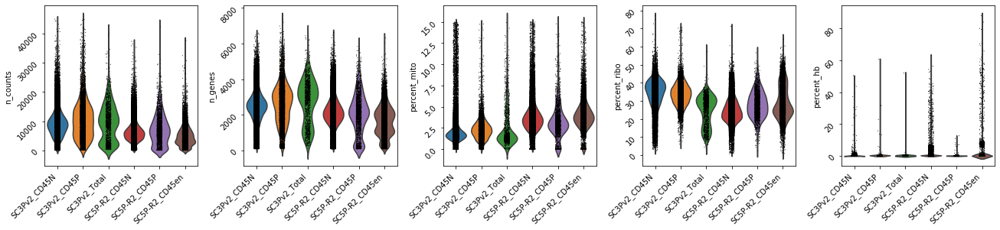

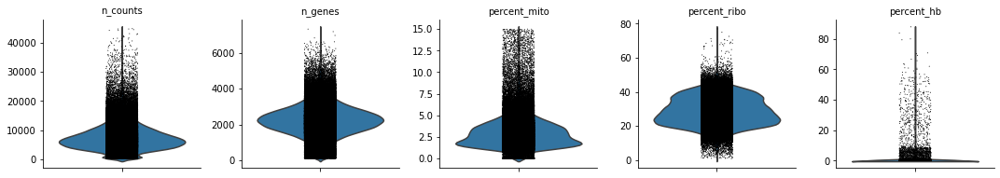

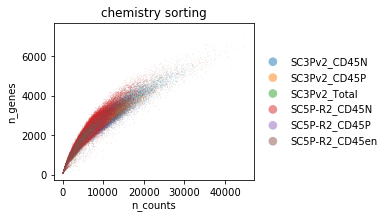

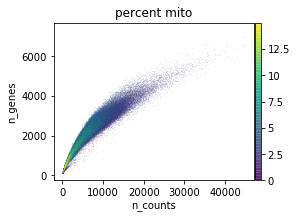

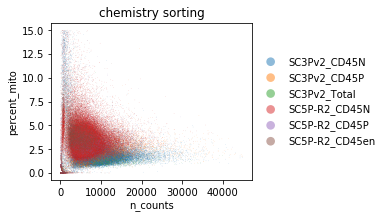

...

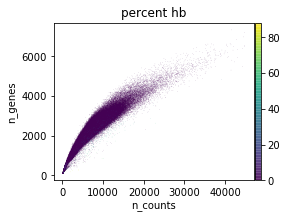

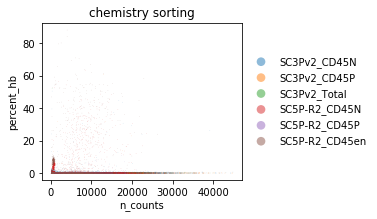

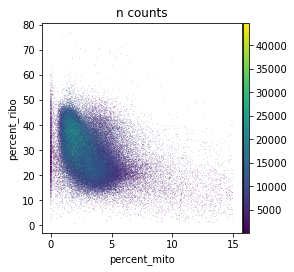

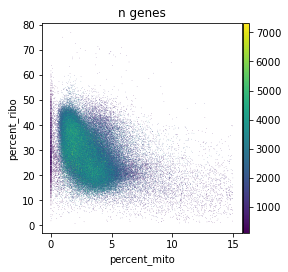

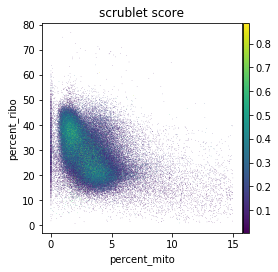

In [10]:
ss.lib.set_figsize((4,4))
ss.lib.simple_default_pipeline(ad, qc_only=True, batch='chemistry_sorting')
sc.pl.scatter(ad, x='percent_mito', y='percent_ribo', color='n_counts')
sc.pl.scatter(ad, x='percent_mito', y='percent_ribo', color='n_genes')
sc.pl.scatter(ad, x='percent_mito', y='percent_ribo', color='scrublet_score')

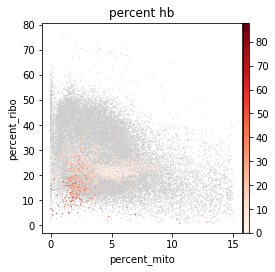

In [15]:
sc.pl.scatter(ad, x='percent_mito', y='percent_ribo', color='percent_hb', color_map=expr_cmap, size=5)

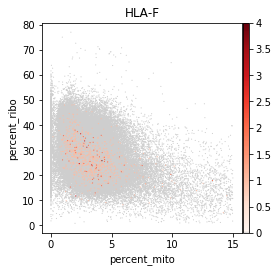

In [14]:
sc.pl.scatter(ad, x='percent_mito', y='percent_ribo', color='HLA-F', color_map=expr_cmap, size=5)

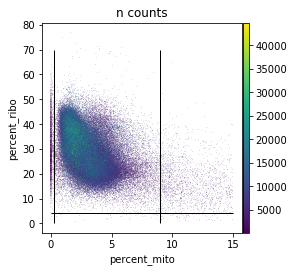

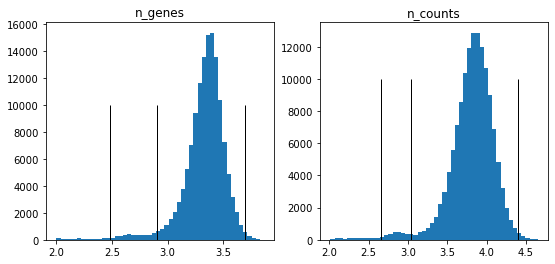

In [19]:
ss.lib.set_figsize((4,4))
ax = sc.pl.scatter(ad, x='percent_mito', y='percent_ribo', color='n_counts', show=False)
ax.vlines(x=[0.25, 9], ymin=0, ymax=70, linewidth=1)
ax.hlines(y=4, xmin=0, xmax=15, linewidth=1)
ss.lib.set_figsize((9,4))
fig, ax = plt.subplots(ncols=2)
_ = ax[0].hist(np.log10(ad.obs.loc[(ad.obs['percent_mito']>0.25) & (ad.obs['percent_mito']<9) & (ad.obs['percent_ribo']>4), 'n_genes']), bins=50)
ax[0].set_title('n_genes')
ax[0].vlines(x=np.log10(np.array([300,800,5000])), ymin=0, ymax=10000, linewidth=1)
_ = ax[1].hist(np.log10(ad.obs.loc[(ad.obs['percent_mito']>0.25) & (ad.obs['percent_mito']<9) & (ad.obs['percent_ribo']>4), 'n_counts']), bins=50)
ax[1].set_title('n_counts')
ax[1].vlines(x=np.log10(np.array([450,1100,25000])), ymin=0, ymax=10000, linewidth=1)
ss.lib.set_figsize((4,4))

# 3. Default preprocessing

In [11]:
MIN_PCT_MITO = 0.25
MAX_PCT_MITO = 9
MIN_PCT_RIBO = 4
MIN_N_GENE = 300
MIN_N_UMI = 450
MAX_N_UMI = 25000
MAX_PCT_HB = 2.5
MIN_N_CELL = 3
CLUSTER_RESOLUTIONS = [0.1, 0.2, 0.3, 0.4, 0.5]

In [12]:
ad = ad[
    (ad.obs.percent_mito >= MIN_PCT_MITO) &
    (ad.obs.percent_mito < MAX_PCT_MITO) &
    (ad.obs.percent_ribo >= MIN_PCT_RIBO) &
    (ad.obs.n_genes >= MIN_N_GENE) &
    (ad.obs.n_counts >= MIN_N_UMI) &
    (ad.obs.n_counts < MAX_N_UMI) &
    (ad.obs.percent_hb < MAX_PCT_HB), :]
ad = ad[:, (ad.var.n_cells >= MIN_N_CELL)]

In [23]:
ad1 = ad.copy()[:, ~(ad.var.mito | ad.var.hb | ad.var.ribo)]

ss.lib.simple_default_pipeline(
    ad1,
    filter_params=None,
    hvg_params={'flavor': 'seurat', 'by_batch': ['chemistry', 2]},
    scale_params={'max_value': 10},
    pca_params={'n_comps': 50, 'svd_solver': 'arpack', 'use_highly_variable': True},
    harmony_params=None,
    nb_params={'use_rep': 'X_pca', 'key_added': 'orig'},
    umap_params={'use_graph': 'neighbors_orig', 'key_added': 'orig'},
    leiden_params={'resolution': CLUSTER_RESOLUTIONS, 'use_graph': 'neighbors_orig', 'key_added': 'orig'},
    tsne_params=None, diffmap_params=None, fdg_params=None,
)

k_annot = (ad1.obs['annot'] != 'nan').values
ad1.obs['lr_annot'] = ss.lib.LR_annotate(
    ad1, train_label=ad1.obs['annot'].values, train_x=ad1.obsm['X_pca'], subset=k_annot, use_rep='X_pca', return_label=True)
ad1.obs['lr_annot'] = ad1.obs['lr_annot'].astype('category')

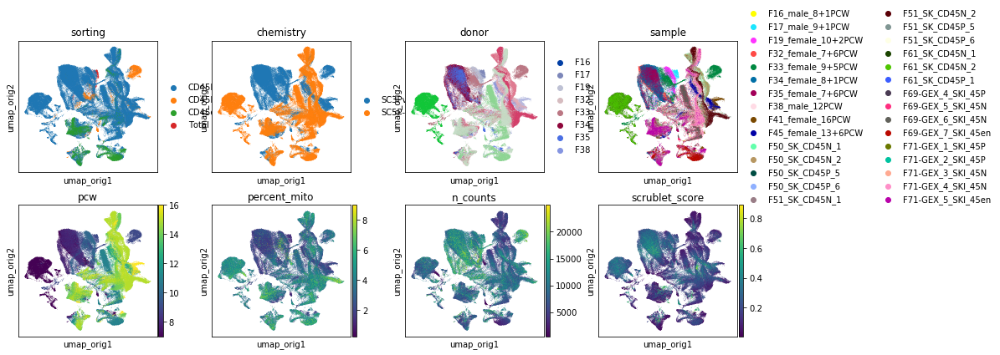

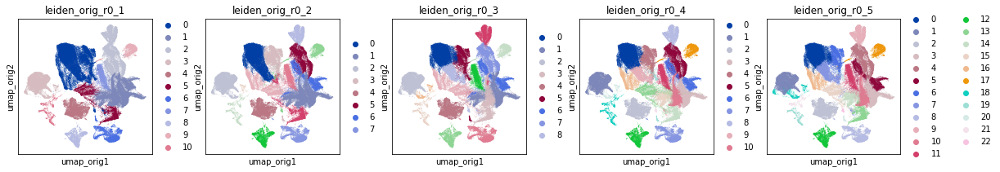

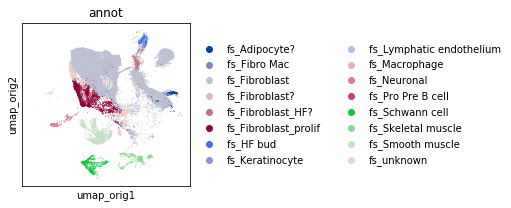

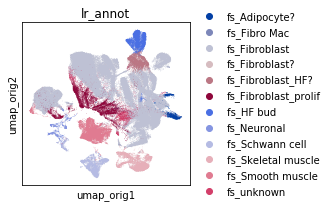

                      freq         p
leiden_orig_r0_3                    
0                 0.000265  0.784015
1                 0.013615  0.784015
2                 0.000510  0.784015
3                 0.016478  0.784015
4                 0.036800  0.565164
5                 0.018834  0.784015
6                 0.005402  0.784015
7                 0.002335  0.784015
8                 0.003626  0.784015
9                 0.003563  0.784015
10                0.027084  0.784015
11                0.045095  0.366202
12                0.047528  0.366202
13                0.057300  0.219125
14                0.021225  0.784015
15                0.067416  0.128612
16                0.000000  0.784015
                     score         p
leiden_orig_r0_3                    
0                 0.239393  0.431285
1                 0.142177  0.794486
2                 0.223724  0.431285
3                 0.136638  0.794486
4                 0.100772  0.794486
5                 0.173102  0.760229
6

In [24]:
ad1.obs['doublet'] = ad1.obs['bh_doublet_pval'] < 0.05
ad1.obs['doublet'] = ad1.obs['doublet'].astype('category')
ss.lib.set_figsize((3,3))
plot_scatter(
    ad1, basis='umap_orig',
    color=['sorting', 'chemistry', 'donor', 'sample', 'pcw', 'percent_mito', 'n_counts', 'scrublet_score'])
plot_scatter(
    ad1, basis='umap_orig', ncols=len(CLUSTER_RESOLUTIONS),
    color=[f'leiden_orig_r{str(res).replace(".", "_")}' for res in CLUSTER_RESOLUTIONS])
plot_scatter(
    ad1[k_annot, :], basis='umap_orig',
    color='annot')
plot_scatter(
    ad1, basis='umap_orig',
    color='lr_annot')

doublet_freq = ad1.obs.groupby('leiden_orig_r0_3')['doublet'].agg(lambda x: sum(x)/len(x))
_, p = ss.lib.test_outlier(doublet_freq, upper_mad_only=False)
print(pd.DataFrame({'freq': doublet_freq, 'p': p}))

doublet_freq = ad1.obs.groupby('leiden_orig_r0_3')['scrublet_score'].agg(lambda x: sum(x)/len(x))
_, p = ss.lib.test_outlier(doublet_freq, upper_mad_only=False)
print(pd.DataFrame({'score': doublet_freq, 'p': p}))

In [26]:
ad2 = ad.copy()[:,~(ad.var.mito | ad.var.hb | ad.var.ribo | ad.var.cc)]

ss.lib.simple_default_pipeline(
    ad2,
    filter_params=None,
    hvg_params={'flavor': 'seurat', 'by_batch': ['chemistry', 2]},
    scale_params={'max_value': 10},
    pca_params={'n_comps': 50, 'svd_solver': 'arpack', 'use_highly_variable': True},
    harmony_params=None,
    nb_params={'use_rep': 'X_pca', 'key_added': 'orig'},
    umap_params={'use_graph': 'neighbors_orig', 'key_added': 'orig'},
    leiden_params={'resolution': CLUSTER_RESOLUTIONS, 'use_graph': 'neighbors_orig', 'key_added': 'orig'},
    tsne_params=None, diffmap_params=None, fdg_params=None,
)

k_annot = (ad2.obs['annot'] != 'nan').values
ad2.obs['lr_annot'] = ss.lib.LR_annotate(
    ad2, train_label=ad2.obs['annot'].values, train_x=ad2.obsm['X_pca'], subset=k_annot, use_rep='X_pca', return_label=True)
ad2.obs['lr_annot'] = ad2.obs['lr_annot'].astype('category')

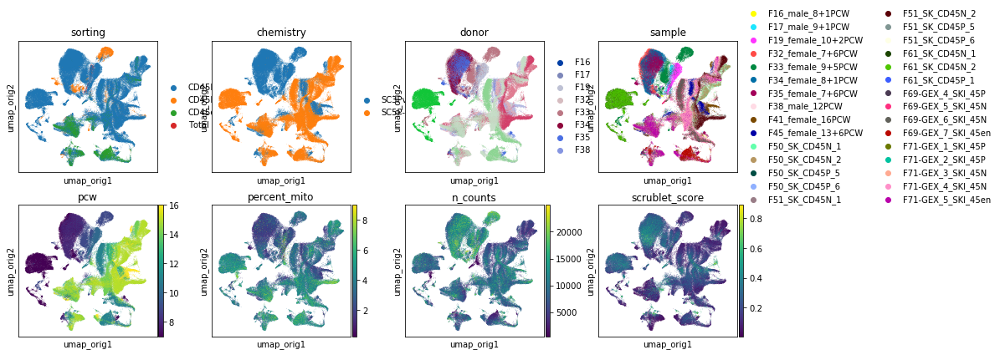

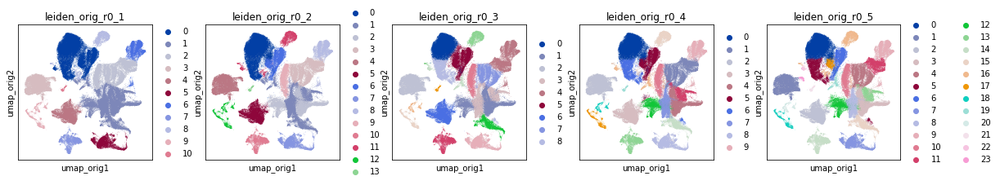

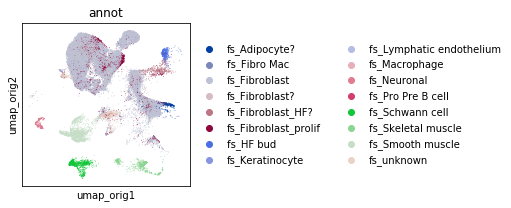

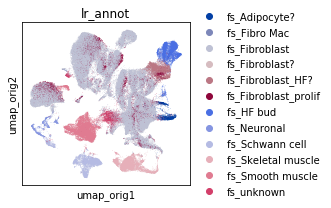

                      freq         p
leiden_orig_r0_3                    
0                 0.000157  0.784668
1                 0.014900  0.784668
2                 0.000489  0.784668
3                 0.005254  0.784668
4                 0.025775  0.784668
5                 0.001364  0.784668
6                 0.036064  0.784668
7                 0.001027  0.784668
8                 0.003521  0.784668
9                 0.027387  0.784668
10                0.043455  0.784668
11                0.057461  0.746768
12                0.035843  0.784668
13                0.020883  0.784668
14                0.118534  0.011699
15                0.081664  0.219495
16                0.042105  0.784668
17                0.000000  0.784668
                     score         p
leiden_orig_r0_3                    
0                 0.232517  0.081877
1                 0.149159  0.822263
2                 0.221193  0.093195
3                 0.160555  0.695493
4                 0.091187  0.858839
5

In [27]:
ad2.obs['doublet'] = ad2.obs['bh_doublet_pval'] < 0.05
ad2.obs['doublet'] = ad2.obs['doublet'].astype('category')

ss.lib.set_figsize((3,3))
plot_scatter(
    ad2, basis='umap_orig',
    color=['sorting', 'chemistry', 'donor', 'sample', 'pcw', 'percent_mito', 'n_counts', 'scrublet_score'])
plot_scatter(
    ad2, basis='umap_orig', ncols=len(CLUSTER_RESOLUTIONS),
    color=[f'leiden_orig_r{str(res).replace(".", "_")}' for res in CLUSTER_RESOLUTIONS])
plot_scatter(ad2[k_annot, :], basis='umap_orig', color='annot')
plot_scatter(ad2, basis='umap_orig', color='lr_annot')


doublet_freq = ad2.obs.groupby('leiden_orig_r0_3')['doublet'].agg(lambda x: sum(x)/len(x))
_, p = ss.lib.test_outlier(doublet_freq, upper_mad_only=False)
print(pd.DataFrame({'freq': doublet_freq, 'p': p}))

doublet_freq = ad2.obs.groupby('leiden_orig_r0_3')['scrublet_score'].agg(lambda x: sum(x)/len(x))
_, p = ss.lib.test_outlier(doublet_freq, upper_mad_only=False)
print(pd.DataFrame({'score': doublet_freq, 'p': p}))

In [32]:
# import gc
gc.collect()

49621

# 4.1 Harmony

In [30]:
ss.lib.simple_default_pipeline(
    ad1,
    filter_params=None, norm_params=None, hvg_params=None, scale_params=None, pca_params=None,
    harmony_params={'batch': 'sample', 'key_added': 'hm'},
    nb_params={'use_rep': 'X_pca_hm', 'key_added': 'hm'},
    umap_params={'use_graph': 'neighbors_hm', 'key_added': 'hm'},
    leiden_params={'resolution': CLUSTER_RESOLUTIONS, 'use_graph': 'neighbors_hm', 'key_added': 'hm'},
    tsne_params=None, diffmap_params=None, fdg_params=None,
)

AnnData object with n_obs × n_vars = 135132 × 27226 
    obs: 'bh_doublet_pval', 'cell_caller', 'cluster_scrublet_score', 'doublet_pval', 'mt_prop', 'n_counts', 'n_genes', 'sanger_id', 'scrublet_score', 'chemistry', 'donor', 'gender', 'pcw', 'sorting', 'sample', 'chemistry_sorting', 'annot', 'hierarchy1', 'percent_mito', 'percent_ribo', 'percent_hb', 'leiden_orig_r0_1', 'leiden_orig_r0_2', 'leiden_orig_r0_3', 'leiden_orig_r0_4', 'leiden_orig_r0_5', 'lr_annot', 'doublet', 'leiden_hm_r0_1', 'leiden_hm_r0_2', 'leiden_hm_r0_3', 'leiden_hm_r0_4', 'leiden_hm_r0_5'
    var: 'gene_ids', 'cc', 'mito', 'ribo', 'hb', 'n_cells', 'highly_variable'
    uns: 'pca', 'neighbors_orig', 'leiden', 'sorting_colors', 'chemistry_colors', 'donor_colors', 'sample_colors', 'leiden_orig_r0_1_colors', 'leiden_orig_r0_2_colors', 'leiden_orig_r0_3_colors', 'leiden_orig_r0_4_colors', 'leiden_orig_r0_5_colors', 'lr_annot_colors', 'neighbors_hm', 'neighbors'
    obsm: 'X_pca', 'X_umap_orig', 'X_pca_hm', 'X_umap_hm'
  

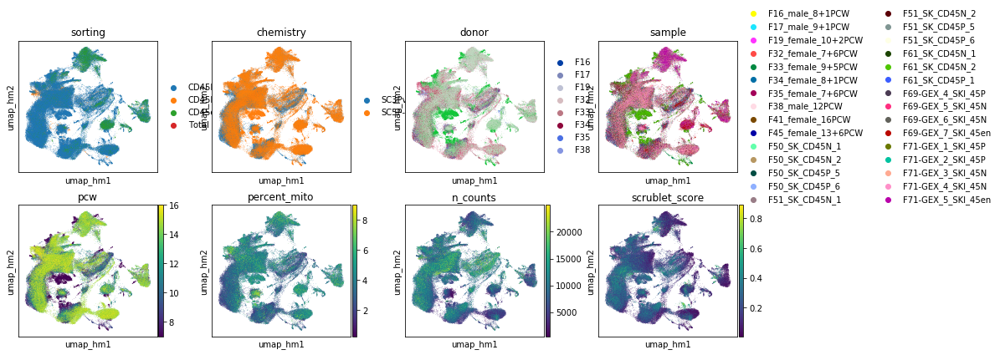

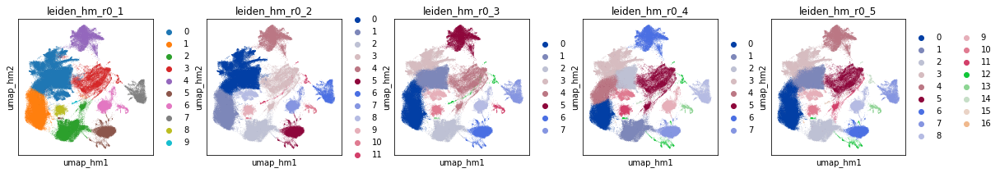

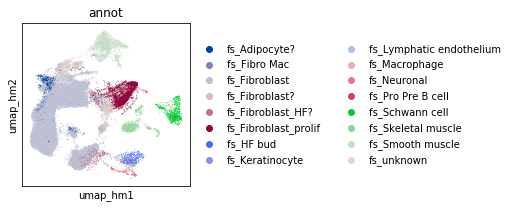

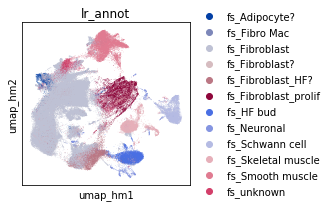

                    freq         p
leiden_hm_r0_3                    
0               0.005207  0.759354
1               0.011819  0.759354
2               0.003807  0.759354
3               0.018937  0.719405
4               0.008030  0.759354
5               0.032995  0.310501
6               0.041588  0.190223
7               0.062464  0.019097
8               0.027973  0.419677
9               0.000499  0.759354
10              0.047107  0.133085
11              0.009639  0.759354
12              0.010687  0.759354
13              0.038835  0.201446
14              0.000000  0.759354
                   score        p
leiden_hm_r0_3                   
0               0.196606  0.89042
1               0.141766  0.89042
2               0.158632  0.89042
3               0.166281  0.89042
4               0.175302  0.89042
5               0.114741  0.89042
6               0.106283  0.89042
7               0.098099  0.89042
8               0.128547  0.89042
9               0.219652  0.890

In [31]:
ss.lib.set_figsize((3,3))
plot_scatter(
    ad1, basis='umap_hm',
    color=['sorting', 'chemistry', 'donor', 'sample', 'pcw', 'percent_mito', 'n_counts', 'scrublet_score'])
plot_scatter(
    ad1, basis='umap_hm', ncols=len(CLUSTER_RESOLUTIONS),
    color=[f'leiden_hm_r{str(res).replace(".", "_")}' for res in CLUSTER_RESOLUTIONS])
plot_scatter(ad1[k_annot, :], basis='umap_hm', color='annot')
plot_scatter(ad1, basis='umap_hm', color='lr_annot')

In [25]:
doublet_freq = ad1.obs.groupby('leiden_hm_r0_1')['doublet'].agg(lambda x: sum(x=='True')/len(x))
_, p = ss.lib.test_outlier(doublet_freq, upper_mad_only=False)
print(pd.DataFrame({'freq': doublet_freq, 'p': p}))

doublet_freq = ad1.obs.groupby('leiden_hm_r0_1')['scrublet_score'].agg(lambda x: sum(x)/len(x))
_, p = ss.lib.test_outlier(doublet_freq, upper_mad_only=False)
print(pd.DataFrame({'score': doublet_freq, 'p': p}))

                    freq         p
leiden_hm_r0_1                    
0               0.014141  0.781747
1               0.002160  0.781747
2               0.003219  0.781747
3               0.008952  0.781747
4               0.032937  0.779459
5               0.041242  0.695829
6               0.026253  0.781747
7               0.062476  0.516764
8               0.047589  0.695829
9               0.000000  0.781747
                   score         p
leiden_hm_r0_1                    
0               0.163432  0.858562
1               0.190454  0.858562
2               0.160959  0.858562
3               0.171995  0.858562
4               0.115006  0.906167
5               0.106643  0.906167
6               0.127895  0.906167
7               0.098099  0.906167
8               0.157439  0.858562
9               0.212245  0.858562


In [ ]:
DE_RES = 0.1

hm_de_genes1 = diffexp(
    ad1, basis='umap', key='hm', res=DE_RES, method=DE_METHOD,
    filter_params=DE_FILTERS,
    extra_genes=KNOWN_MARKERS + ['CDK1', 'MCM2']
)
hm_de_genes1.groupby('cluster').head(5)

res = str(DE_RES).replace(".", "_")
hm_de_genes1.groupby('cluster').head(30).to_csv(
    f'2.{CATEGORY_CLUSTER_ID+1}_{CATEGORY_NAME}_harmony_withCC_leiden_r{res}_DE_filtered_top30.txt', sep='\t', index=False)
ss.lib.extract_de_table(ad1.uns[f'rank_genes_groups_hm_r{res}']).groupby('cluster').head(200).to_csv(
    f'2.{CATEGORY_CLUSTER_ID+1}_{CATEGORY_NAME}_harmony_withCC_leiden_r{res}_DE_top200.txt', sep='\t', index=False)

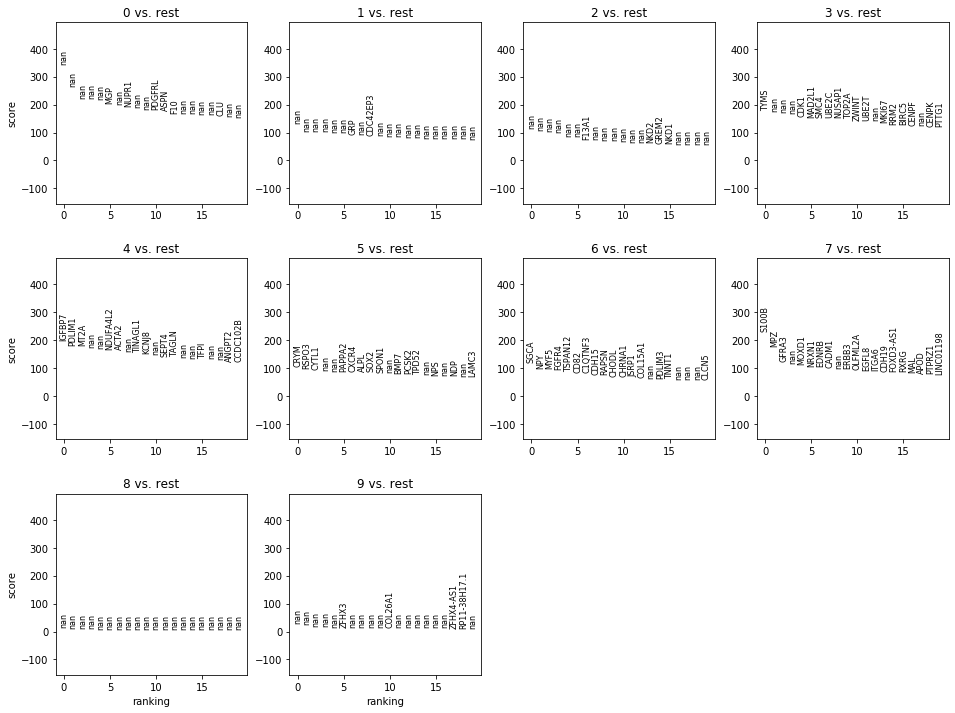

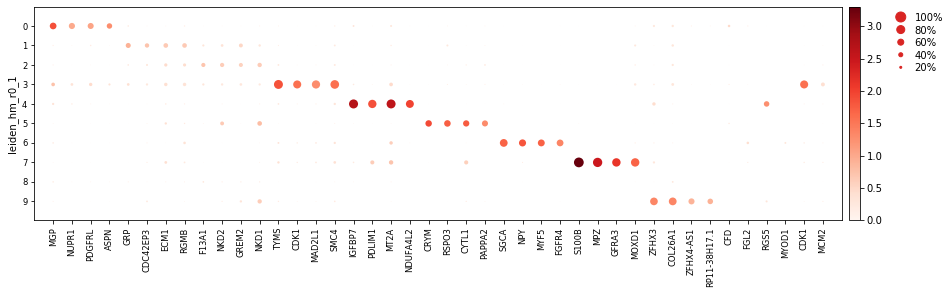

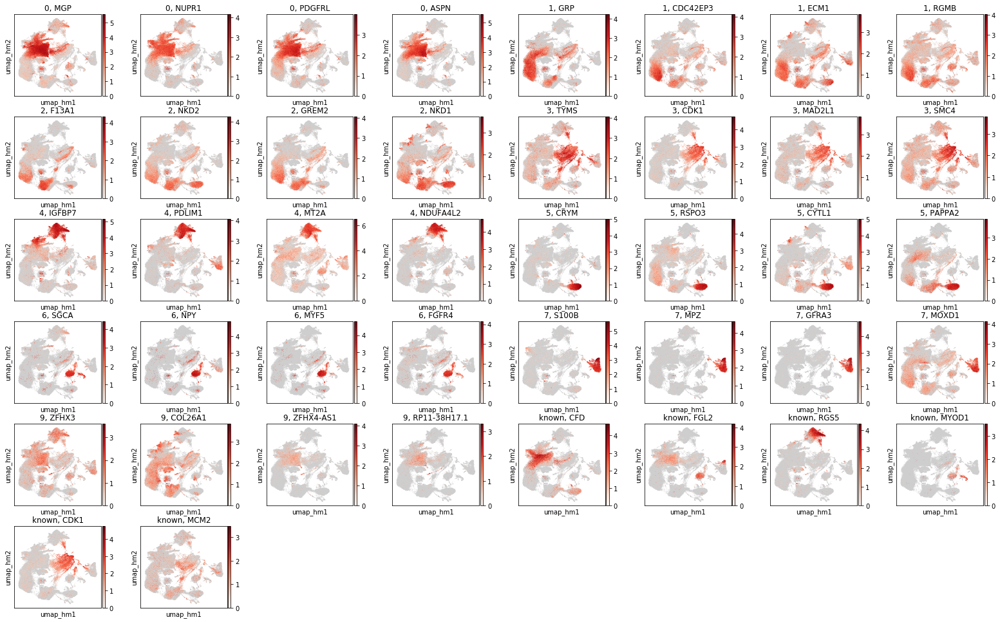

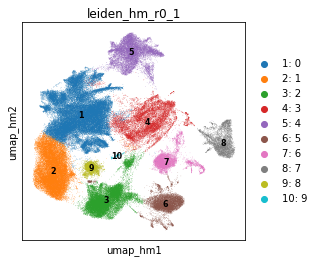

In [20]:
_ = ss.lib.plot_diffexp(ad1, basis='umap_hm', key='rank_genes_groups_hm_r0_1_filtered', extra_genes=KNOWN_MARKERS + ['CDK1', 'MCM2'], ncols=8)

In [40]:
ss.lib.simple_default_pipeline(
    ad2,
    filter_params=None, norm_params=None, hvg_params=None, scale_params=None, pca_params=None,
    harmony_params={'batch': 'sample', 'key_added': 'hm'},
    nb_params={'use_rep': 'X_pca_hm', 'key_added': 'hm'},
    umap_params={'use_graph': 'neighbors_hm', 'key_added': 'hm'},
    leiden_params={'resolution': CLUSTER_RESOLUTIONS, 'use_graph': 'neighbors_hm', 'key_added': 'hm'},
    tsne_params=None, diffmap_params=None, fdg_params=None,
)

AnnData object with n_obs × n_vars = 135132 × 26664 
    obs: 'bh_doublet_pval', 'cell_caller', 'cluster_scrublet_score', 'doublet_pval', 'mt_prop', 'n_counts', 'n_genes', 'sanger_id', 'scrublet_score', 'chemistry', 'donor', 'gender', 'pcw', 'sorting', 'sample', 'chemistry_sorting', 'annot', 'hierarchy1', 'percent_mito', 'percent_ribo', 'percent_hb', 'leiden_orig_r0_1', 'leiden_orig_r0_2', 'leiden_orig_r0_3', 'leiden_orig_r0_4', 'leiden_orig_r0_5', 'lr_annot', 'doublet', 'leiden_hm_r0_1', 'leiden_hm_r0_2', 'leiden_hm_r0_3', 'leiden_hm_r0_4', 'leiden_hm_r0_5'
    var: 'gene_ids', 'cc', 'mito', 'ribo', 'hb', 'n_cells', 'highly_variable'
    uns: 'pca', 'neighbors_orig', 'leiden', 'sorting_colors', 'chemistry_colors', 'donor_colors', 'sample_colors', 'leiden_orig_r0_1_colors', 'leiden_orig_r0_2_colors', 'leiden_orig_r0_3_colors', 'leiden_orig_r0_4_colors', 'leiden_orig_r0_5_colors', 'lr_annot_colors', 'neighbors_hm', 'neighbors'
    obsm: 'X_pca', 'X_umap_orig', 'X_pca_hm', 'X_umap_hm'
  

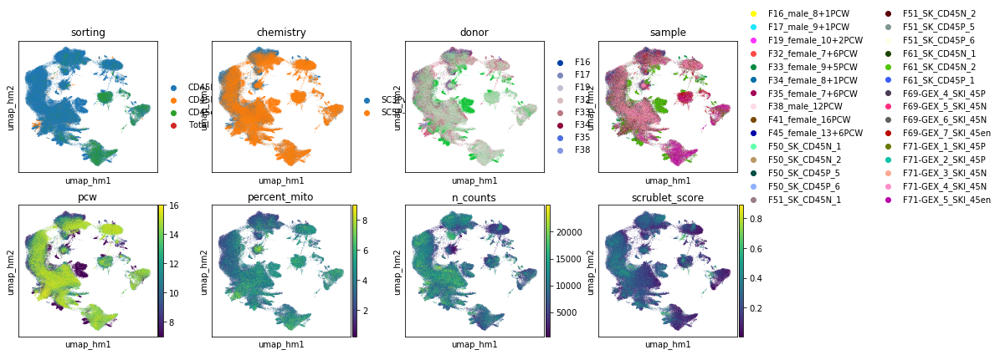

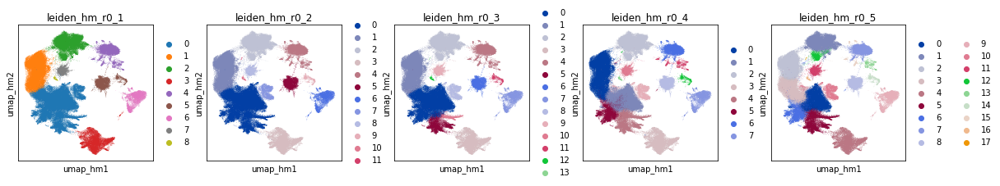

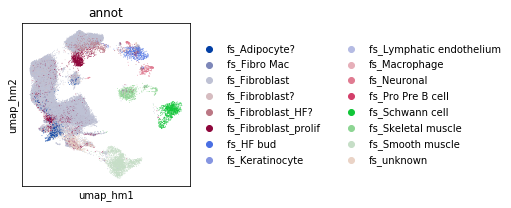

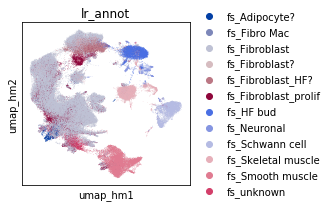

                    freq         p
leiden_hm_r0_1                    
0               0.014084  0.858003
1               0.002102  0.858003
2               0.002645  0.858003
3               0.035646  0.858003
4               0.039840  0.858003
5               0.028120  0.858003
6               0.053571  0.858003
7               0.045823  0.858003
8               0.000000  0.858003
                   score         p
leiden_hm_r0_1                    
0               0.165254  0.866776
1               0.191956  0.866776
2               0.155053  0.866776
3               0.118505  0.866776
4               0.111606  0.866776
5               0.134219  0.866776
6               0.094837  0.866776
7               0.160059  0.866776
8               0.205426  0.866776


In [43]:
ss.lib.set_figsize((3,3))
plot_scatter(
    ad2, basis='umap_hm', 
    color=['sorting', 'chemistry', 'donor', 'sample', 'pcw', 'percent_mito', 'n_counts', 'scrublet_score'])
plot_scatter(
    ad2, basis='umap_hm', ncols=len(CLUSTER_RESOLUTIONS),
    color=[f'leiden_hm_r{str(res).replace(".", "_")}' for res in CLUSTER_RESOLUTIONS])
plot_scatter(ad2[k_annot, :], basis='umap_hm', color='annot')
plot_scatter(ad2, basis='umap_hm', color='lr_annot')


doublet_freq = ad2.obs.groupby('leiden_hm_r0_1')['doublet'].agg(lambda x: sum(x)/len(x))
_, p = ss.lib.test_outlier(doublet_freq, upper_mad_only=False)
print(pd.DataFrame({'freq': doublet_freq, 'p': p}))

doublet_freq = ad2.obs.groupby('leiden_hm_r0_1')['scrublet_score'].agg(lambda x: sum(x)/len(x))
_, p = ss.lib.test_outlier(doublet_freq, upper_mad_only=False)
print(pd.DataFrame({'score': doublet_freq, 'p': p}))

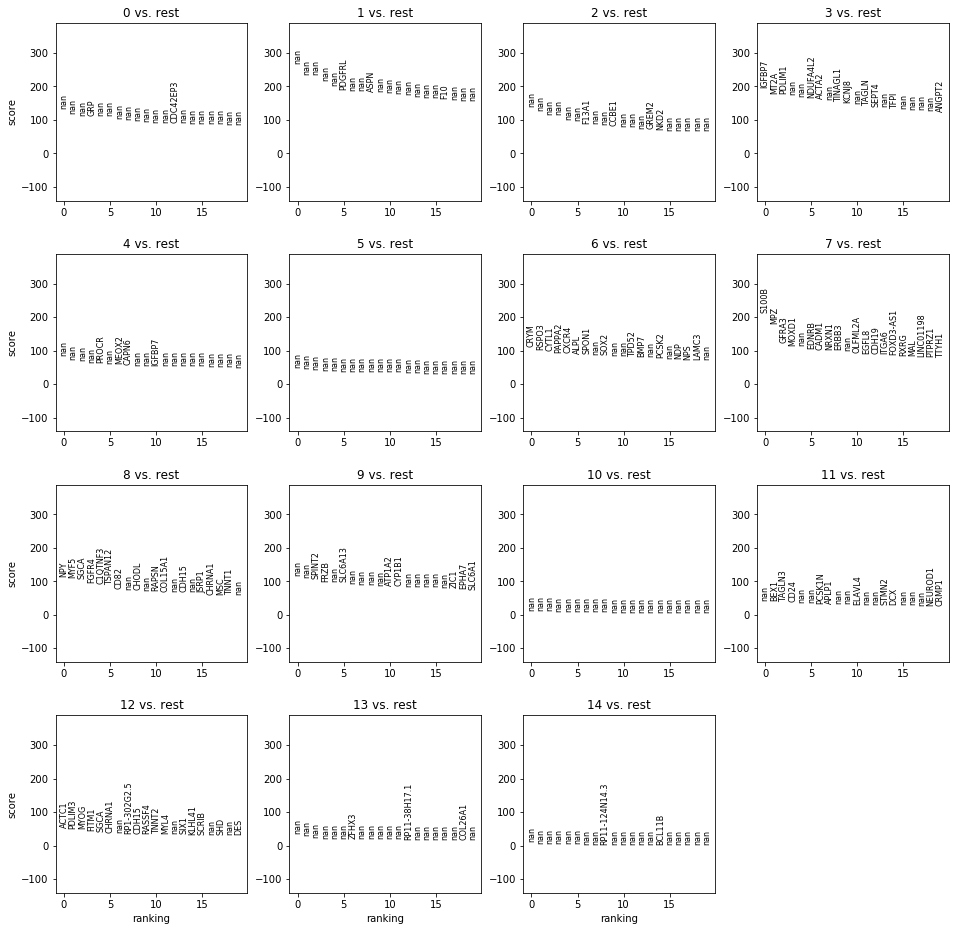

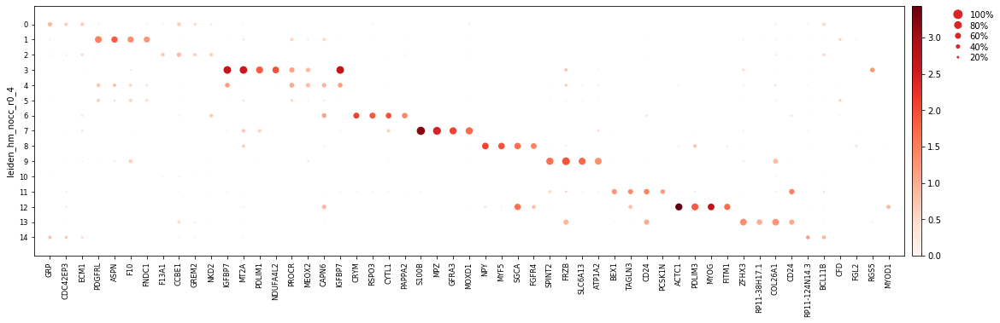

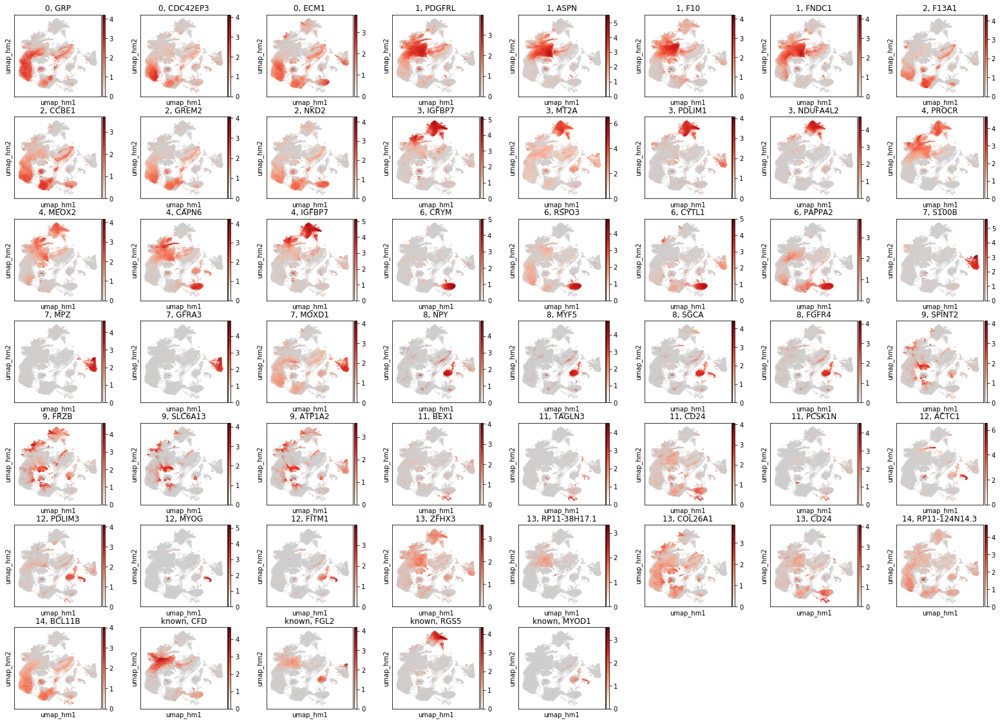

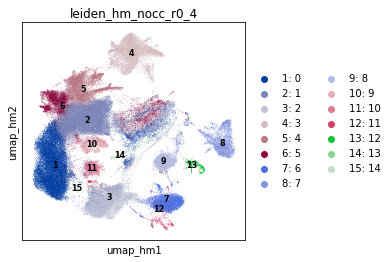

In [36]:
# hm_de_genes2 = ss.lib.diffexp(ad1, groupby='leiden_hm_nocc_r0_4', key_added='hm_r0_4', method=DE_METHOD, filter_params=DE_FILTERS)
hm_de_genes2.groupby('cluster').head(5)
_ = ss.lib.plot_diffexp(ad1, basis='umap_hm', key='rank_genes_groups_hm_r0_4_filtered', extra_genes=KNOWN_MARKERS, ncols=8)

# 4.2 BBKNN

In [48]:
ad1.uns['neighbors'] = ad1.uns['neighbors_orig']
bbknn.bbknn(ad1, batch_key='sample', metric='euclidean', neighbors_within_batch=2, trim=None, copy=False)
ad1.uns['neighbors_bk'] = ad1.uns['neighbors']
ss.lib.umap(ad1, use_graph='neighbors_bk', key_added='bk')
ss.lib.leiden(ad1, use_graph='neighbors_bk', key_added='bk', resolution=CLUSTER_RESOLUTIONS)

AnnData object with n_obs × n_vars = 135132 × 27226 
    obs: 'bh_doublet_pval', 'cell_caller', 'cluster_scrublet_score', 'doublet_pval', 'mt_prop', 'n_counts', 'n_genes', 'sanger_id', 'scrublet_score', 'chemistry', 'donor', 'gender', 'pcw', 'sorting', 'sample', 'chemistry_sorting', 'annot', 'hierarchy1', 'percent_mito', 'percent_ribo', 'percent_hb', 'leiden_orig_r0_1', 'leiden_orig_r0_2', 'leiden_orig_r0_3', 'leiden_orig_r0_4', 'leiden_orig_r0_5', 'lr_annot', 'doublet', 'leiden_hm_r0_1', 'leiden_hm_r0_2', 'leiden_hm_r0_3', 'leiden_hm_r0_4', 'leiden_hm_r0_5', '__is_in_cluster__', 'leiden_bk_r0_1', 'leiden_bk_r0_2', 'leiden_bk_r0_3', 'leiden_bk_r0_4', 'leiden_bk_r0_5'
    var: 'gene_ids', 'cc', 'mito', 'ribo', 'hb', 'n_cells', 'highly_variable'
    uns: 'pca', 'neighbors_orig', 'leiden', 'sorting_colors', 'chemistry_colors', 'donor_colors', 'sample_colors', 'leiden_orig_r0_1_colors', 'leiden_orig_r0_2_colors', 'leiden_orig_r0_3_colors', 'leiden_orig_r0_4_colors', 'leiden_orig_r0_5_color

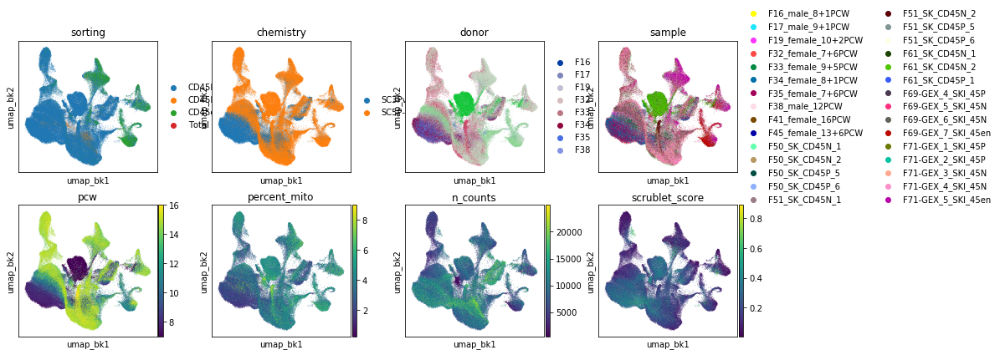

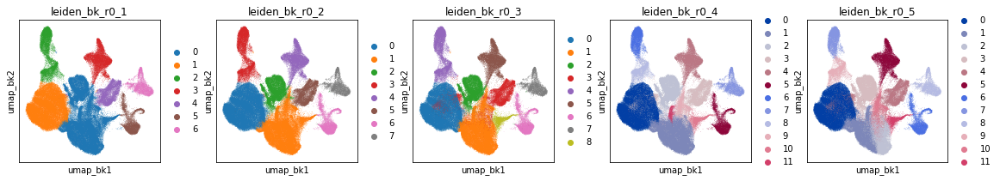

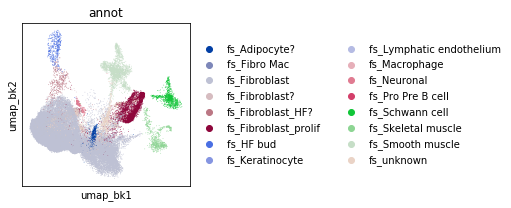

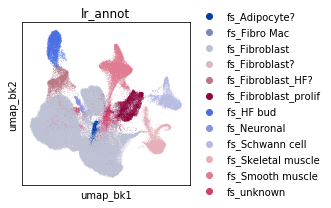

                    freq         p
leiden_bk_r0_2                    
0               0.002726  0.896857
1               0.020126  0.483803
2               0.017181  0.571502
3               0.020067  0.485561
4               0.038143  0.082069
5               0.003994  0.878754
6               0.019101  0.514439
7               0.056825  0.002620
                   score         p
leiden_bk_r0_2                    
0               0.191425  0.134757
1               0.150937  0.373537
2               0.212175  0.066190
3               0.085415  0.827035
4               0.103735  0.722011
5               0.150769  0.374769
6               0.117698  0.625231
7               0.094861  0.776419


In [51]:
ss.lib.set_figsize((3,3))
plot_scatter(
    ad1, basis='umap_bk',
    color=['sorting', 'chemistry', 'donor', 'sample', 'pcw', 'percent_mito', 'n_counts', 'scrublet_score'])
plot_scatter(
    ad1, basis='umap_bk', ncols=len(CLUSTER_RESOLUTIONS),
    color=[f'leiden_bk_r{str(res).replace(".", "_")}' for res in CLUSTER_RESOLUTIONS])
plot_scatter(ad1[k_annot, :], basis='umap_bk', color='annot')
plot_scatter(ad1, basis='umap_bk', color='lr_annot')

In [52]:
doublet_freq = ad1.obs.groupby('leiden_bk_r0_4')['doublet'].agg(lambda x: sum(x)/len(x))
p, p_adj = ss.lib.test_outlier(doublet_freq, upper_mad_only=False)
print(pd.DataFrame({'freq': doublet_freq, 'p': p}))

doublet_freq = ad1.obs.groupby('leiden_bk_r0_4')['scrublet_score'].agg(lambda x: sum(x)/len(x))
p, p_adj = ss.lib.test_outlier(doublet_freq, upper_mad_only=False)
print(pd.DataFrame({'score': doublet_freq, 'p': p}))

                    freq         p
leiden_bk_r0_4                    
0               0.002417  0.836863
1               0.018298  0.495369
2               0.017337  0.519350
3               0.007264  0.751274
4               0.038158  0.104994
5               0.021277  0.421576
6               0.031467  0.201803
7               0.056836  0.007723
8               0.005360  0.787446
9               0.015753  0.558673
10              0.028834  0.251277
11              0.017927  0.504631
                   score         p
leiden_bk_r0_4                    
0               0.184674  0.119514
1               0.156965  0.266283
2               0.210931  0.044401
3               0.176014  0.157570
4               0.103681  0.670005
5               0.119011  0.553220
6               0.083149  0.802319
7               0.094818  0.731355
8               0.089411  0.765739
9               0.162629  0.230500
10              0.132169  0.448703
11              0.119255  0.551297


In [ ]:
DE_RES = 0.4

bk_de_genes1 = diffexp(
    ad1, basis='umap', key='bk', res=DE_RES, method=DE_METHOD,
    filter_params=DE_FILTERS,
    extra_genes=KNOWN_MARKERS + ['CDK1', 'MCM2']
)
bk_de_genes1.groupby('cluster').head(5)

In [54]:
ad2.uns['neighbors'] = ad2.uns['neighbors_orig']
bbknn.bbknn(ad2, batch_key='sample', metric='euclidean', neighbors_within_batch=2, copy=False)
ad2.uns['neighbors_bk'] = ad2.uns['neighbors']
ss.lib.umap(ad2, use_graph='neighbors_bk', key_added='bk')
ss.lib.leiden(ad2, use_graph='neighbors_bk', key_added='bk', resolution=CLUSTER_RESOLUTIONS)

AnnData object with n_obs × n_vars = 135132 × 26664 
    obs: 'bh_doublet_pval', 'cell_caller', 'cluster_scrublet_score', 'doublet_pval', 'mt_prop', 'n_counts', 'n_genes', 'sanger_id', 'scrublet_score', 'chemistry', 'donor', 'gender', 'pcw', 'sorting', 'sample', 'chemistry_sorting', 'annot', 'hierarchy1', 'percent_mito', 'percent_ribo', 'percent_hb', 'leiden_orig_r0_1', 'leiden_orig_r0_2', 'leiden_orig_r0_3', 'leiden_orig_r0_4', 'leiden_orig_r0_5', 'lr_annot', 'doublet', 'leiden_hm_r0_1', 'leiden_hm_r0_2', 'leiden_hm_r0_3', 'leiden_hm_r0_4', 'leiden_hm_r0_5', 'leiden_bk_r0_1', 'leiden_bk_r0_2', 'leiden_bk_r0_3', 'leiden_bk_r0_4', 'leiden_bk_r0_5'
    var: 'gene_ids', 'cc', 'mito', 'ribo', 'hb', 'n_cells', 'highly_variable'
    uns: 'pca', 'neighbors_orig', 'leiden', 'sorting_colors', 'chemistry_colors', 'donor_colors', 'sample_colors', 'leiden_orig_r0_1_colors', 'leiden_orig_r0_2_colors', 'leiden_orig_r0_3_colors', 'leiden_orig_r0_4_colors', 'leiden_orig_r0_5_colors', 'lr_annot_colors'

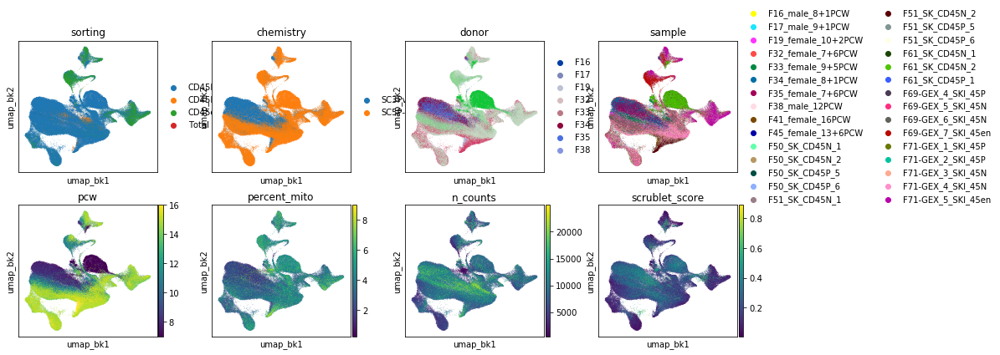

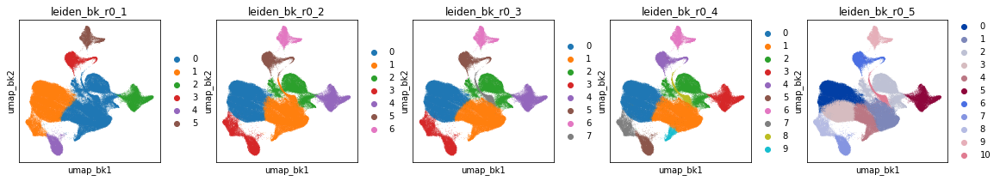

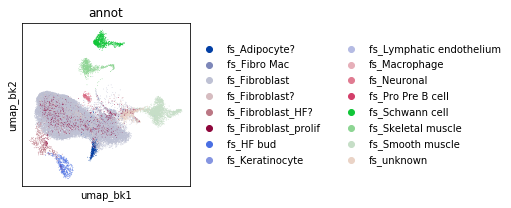

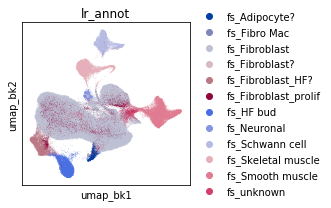

In [57]:
ss.lib.set_figsize((3,3))
plot_scatter(
    ad2, basis='umap_bk',
    color=['sorting', 'chemistry', 'donor', 'sample', 'pcw', 'percent_mito', 'n_counts', 'scrublet_score'])
plot_scatter(
    ad2, basis='umap_bk', ncols=len(CLUSTER_RESOLUTIONS),
    color=[f'leiden_bk_r{str(res).replace(".", "_")}' for res in CLUSTER_RESOLUTIONS])
plot_scatter(ad2[k_annot, :], basis='umap_bk', color='annot')
plot_scatter(ad2, basis='umap_bk', color='lr_annot')

In [58]:
doublet_freq = ad2.obs.groupby('leiden_bk_r0_4')['doublet'].agg(lambda x: sum(x)/len(x))
p, p_adj = ss.lib.test_outlier(doublet_freq, upper_mad_only=False)
print(pd.DataFrame({'freq': doublet_freq, 'p': p}))

doublet_freq = ad2.obs.groupby('leiden_bk_r0_4')['scrublet_score'].agg(lambda x: sum(x)/len(x))
p, p_adj = ss.lib.test_outlier(doublet_freq, upper_mad_only=False)
print(pd.DataFrame({'score': doublet_freq, 'p': p}))

                    freq         p
leiden_bk_r0_4                    
0               0.001671  0.886232
1               0.017371  0.564762
2               0.016744  0.581115
3               0.037625  0.118339
4               0.022277  0.435238
5               0.031952  0.210049
6               0.058175  0.005395
7               0.005895  0.822762
8               0.027988  0.293658
9               0.015683  0.608458
                   score         p
leiden_bk_r0_4                    
0               0.185542  0.083901
1               0.158547  0.217207
2               0.200950  0.042678
3               0.102573  0.676368
4               0.119338  0.534428
5               0.086472  0.792186
6               0.095858  0.727820
7               0.089691  0.771183
8               0.132369  0.419917
9               0.127143  0.465572


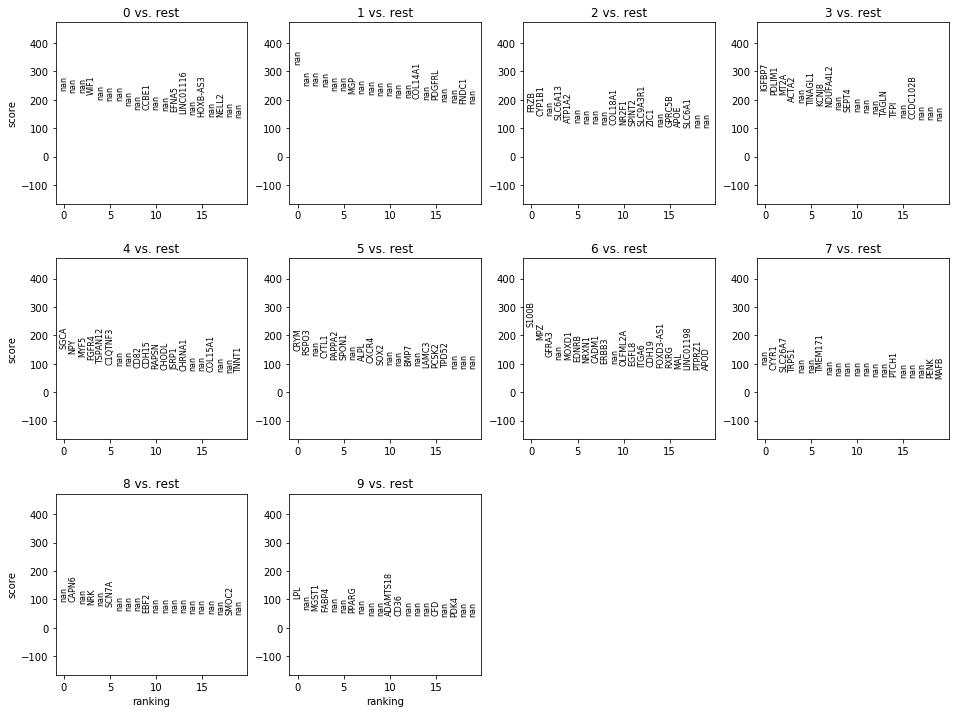

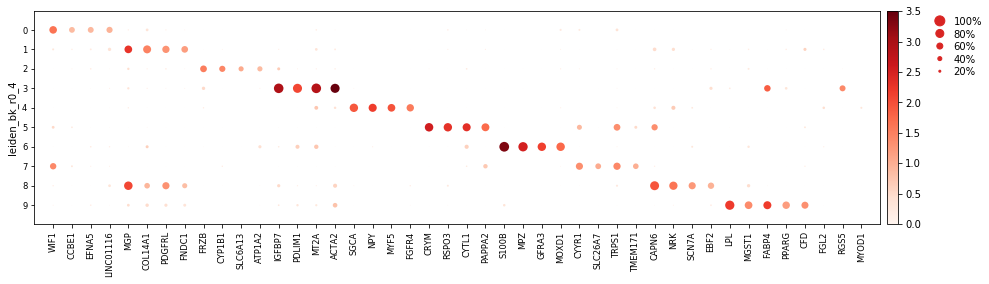

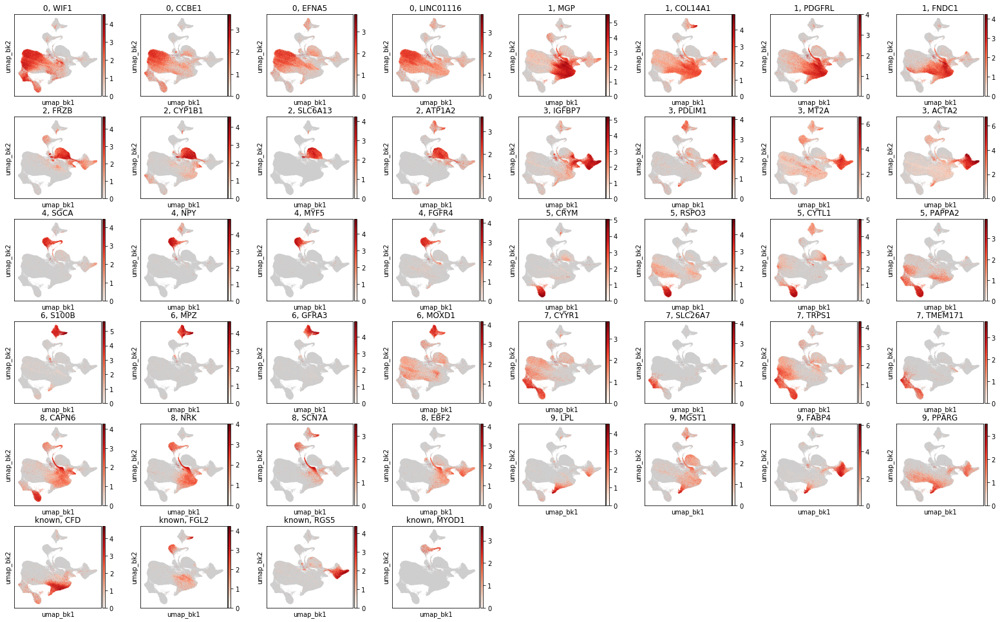

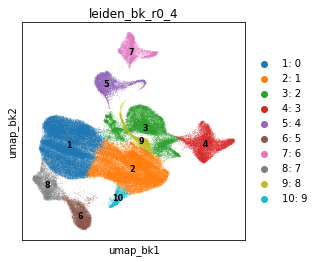

In [32]:
bk_de_genes2 = ss.lib.diffexp(ad2, groupby='leiden_bk_r0_4', key_added='bk_r0_4', method=DE_METHOD, filter_params=DE_FILTERS)
bk_de_genes2.groupby('cluster').head(5)
_ = ss.lib.plot_diffexp(ad2, basis='umap_bk', key='rank_genes_groups_bk_r0_4_filtered', extra_genes=KNOWN_MARKERS, ncols=8)

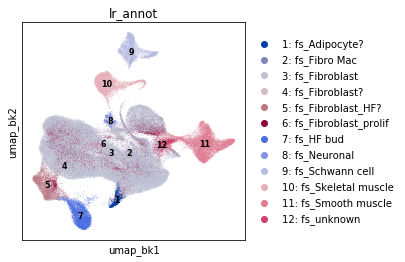

In [33]:
ss.lib.plot_embedding(ad2, basis='umap_bk', groupby='lr_annot')

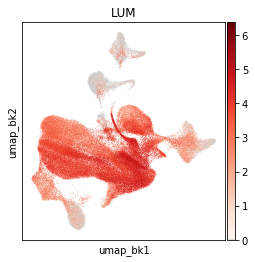

In [35]:
plot_scatter(ad2, basis='umap_bk', color_map=expr_cmap, color=['LUM', ])

# 5. Combine clustering and embeddings

In [59]:
ad1.obsm['X_umap_hm_nocc'] = ad2.obsm['X_umap_hm']
ad1.obsm['X_umap_bk_nocc'] = ad2.obsm['X_umap_bk']
for res in CLUSTER_RESOLUTIONS:
    r = str(res).replace(".", "_")
    ad1.obs[f'leiden_hm_nocc_r{r}'] = ad2.obs[f'leiden_hm_r{r}']
    ad1.obs[f'leiden_bk_nocc_r{r}'] = ad2.obs[f'leiden_bk_r{r}']

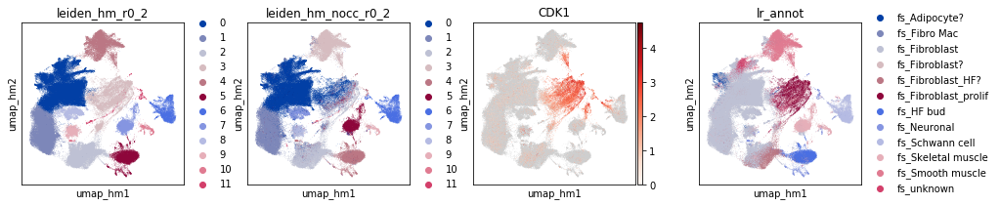

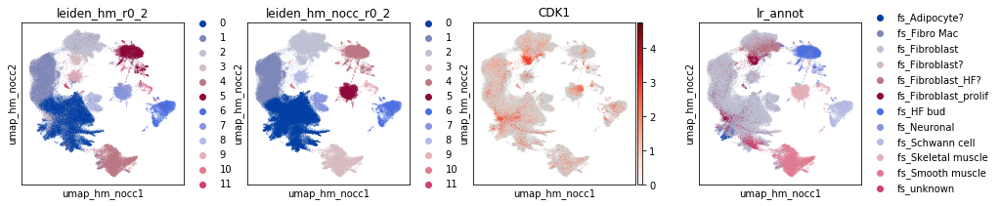

In [60]:
ss.lib.set_figsize((3,3))
plot_scatter(ad1, basis='umap_hm', color_map=expr_cmap,
             color=['leiden_hm_r0_2', 'leiden_hm_nocc_r0_2', 'CDK1', 'lr_annot'])
plot_scatter(ad1, basis='umap_hm_nocc', color_map=expr_cmap,
             color=['leiden_hm_r0_2', 'leiden_hm_nocc_r0_2', 'CDK1', 'lr_annot'])

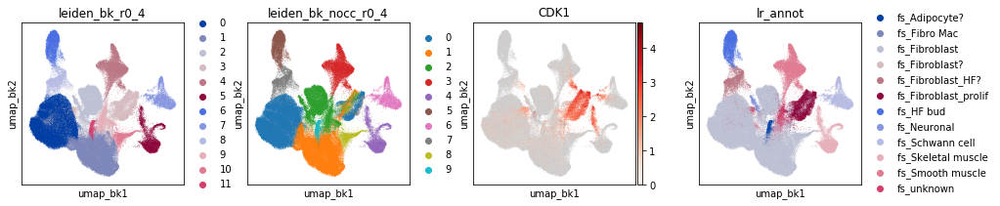

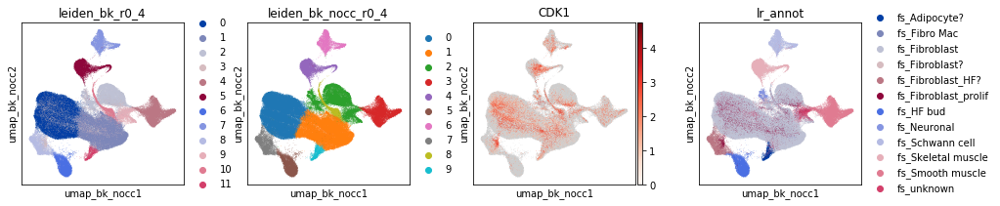

In [62]:
ss.lib.set_figsize((3,3))
plot_scatter(ad1, basis='umap_bk', color_map=expr_cmap,
             color=['leiden_bk_r0_4', 'leiden_bk_nocc_r0_4', 'CDK1', 'lr_annot'])
plot_scatter(ad1, basis='umap_bk_nocc', color_map=expr_cmap,
             color=['leiden_bk_r0_4', 'leiden_bk_nocc_r0_4', 'CDK1', 'lr_annot'])

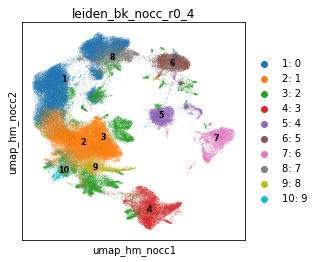

In [10]:
ss.lib.set_figsize((4,4))
ss.lib.plot_embedding(ad1, basis='umap_hm_nocc', groupby='leiden_bk_nocc_r0_4')

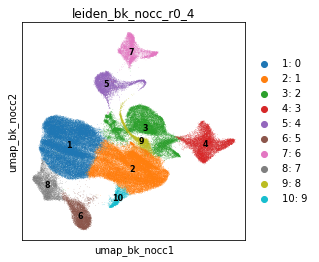

In [13]:
ss.lib.set_figsize((4,4))
ss.lib.plot_embedding(ad1, basis='umap_bk_nocc', groupby='leiden_bk_nocc_r0_4')

In [34]:
ss.lib.cross_table(ad1, 'lr_annot', 'leiden_bk_nocc_r0_4')

leiden_bk_nocc_r0_4,0,1,2,3,4,5,6,7,8,9
lr_annot,,,,,,,,,,
fs_Adipocyte?,4,87,34,3,0,2,1,8,3,1604
fs_Fibro Mac,1,33,0,0,0,0,0,0,2,9
fs_Fibroblast,35814,34025,13950,43,22,32,7,137,2954,327
fs_Fibroblast?,263,11,0,0,0,1,0,24,0,0
fs_Fibroblast_HF?,113,6,148,1,0,140,0,4327,2,3
fs_Fibroblast_prolif,3563,1825,1214,8,0,41,8,492,406,147
fs_HF bud,2,30,4,2,0,6010,2,87,1,4
fs_Neuronal,5,1,1365,1,0,0,50,0,0,1
fs_Schwann cell,0,2,17,0,1,0,5119,1,2,2


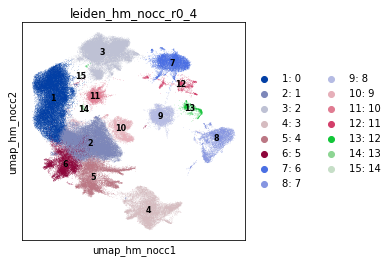

In [29]:
ss.lib.set_figsize((4,4))
ss.lib.plot_embedding(ad1, basis='umap_hm_nocc', groupby='leiden_hm_nocc_r0_4')

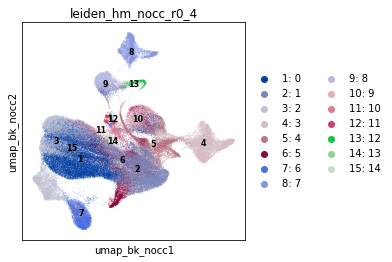

In [30]:
ss.lib.set_figsize((4,4))
ss.lib.plot_embedding(ad1, basis='umap_bk_nocc', groupby='leiden_hm_nocc_r0_4')

In [33]:
ss.lib.cross_table(ad1, 'lr_annot', 'leiden_hm_nocc_r0_4')

leiden_hm_nocc_r0_4,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14
lr_annot,,,,,,,,,,,,,,,
fs_Adipocyte?,47,33,6,3,42,1574,0,1,12,0,28,0,0,0,0
fs_Fibro Mac,0,0,0,0,2,43,0,0,0,0,0,0,0,0,0
fs_Fibroblast,27029,25838,13265,1082,7202,4066,941,23,643,4019,2820,166,27,170,20
fs_Fibroblast?,210,1,85,0,0,1,1,0,0,0,0,1,0,0,0
fs_Fibroblast_HF?,74,1,4451,7,13,3,96,0,14,5,60,7,9,0,0
fs_Fibroblast_prolif,1344,496,2833,197,620,1609,166,13,45,135,121,24,7,94,0
fs_HF bud,1,1,175,1,4,6,5704,2,34,0,1,179,34,0,0
fs_Neuronal,7,0,52,4,0,3,124,119,6,0,51,938,119,0,0
fs_Schwann cell,0,0,0,0,1,2,1,5135,0,0,3,0,2,0,0


In [36]:
ad1.write(f'data/h5ad/fetal_skin_hierarch1_{CATEGORY_NAME}_processed.h5ad', compression='gzip')
ad2.write(f'data/h5ad/fetal_skin_hierarch1_{CATEGORY_NAME}_processed_nocc.h5ad', compression='gzip')

In [7]:
ad = sc.read(f'data/h5ad/fetal_skin_hierarch1_{CATEGORY_NAME}.h5ad')
ad1 = sc.read(f'data/h5ad/fetal_skin_hierarch1_{CATEGORY_NAME}_processed.h5ad')
# ad2 = sc.read(f'data/h5ad/fetal_skin_hierarch1_{CATEGORY_NAME}_processed_nocc.h5ad')

# 6. Fibroblast zoom-in

In [8]:
ad1

AnnData object with n_obs × n_vars = 135132 × 27226 
    obs: 'bh_doublet_pval', 'cell_caller', 'cluster_scrublet_score', 'doublet_pval', 'mt_prop', 'n_counts', 'n_genes', 'sanger_id', 'scrublet_score', 'chemistry', 'donor', 'gender', 'pcw', 'sorting', 'sample', 'chemistry_sorting', 'annot', 'hierarchy1', 'percent_mito', 'percent_ribo', 'percent_hb', 'leiden_orig_r0_1', 'leiden_orig_r0_2', 'leiden_orig_r0_3', 'leiden_orig_r0_4', 'leiden_orig_r0_5', 'lr_annot', 'doublet', 'leiden_hm_r0_1', 'leiden_hm_r0_2', 'leiden_hm_r0_3', 'leiden_hm_r0_4', 'leiden_hm_r0_5', '__is_in_cluster__', 'leiden_bk_r0_1', 'leiden_bk_r0_2', 'leiden_bk_r0_3', 'leiden_bk_r0_4', 'leiden_bk_r0_5', 'leiden_hm_nocc_r0_1', 'leiden_bk_nocc_r0_1', 'leiden_hm_nocc_r0_2', 'leiden_bk_nocc_r0_2', 'leiden_hm_nocc_r0_3', 'leiden_bk_nocc_r0_3', 'leiden_hm_nocc_r0_4', 'leiden_bk_nocc_r0_4', 'leiden_hm_nocc_r0_5', 'leiden_bk_nocc_r0_5'
    var: 'gene_ids', 'cc', 'mito', 'ribo', 'hb', 'n_cells', 'highly_variable'
    uns: 'chemis

In [13]:
adFib = ad.copy()[ad1.obs['leiden_hm_r0_2'].isin(['0','1','2','3','8']).values, :]

In [14]:
adFib = adFib[:, ~(ad.var.mito | ad.var.hb | ad.var.ribo)]

In [15]:
sc.pp.filter_genes(adFib, min_cells=3)

# 6.1. With CC

In [83]:
adFib1 = adFib.copy()

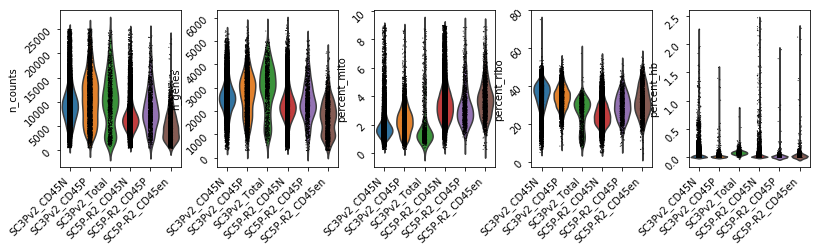

In [84]:
ss.lib.plot_qc(adFib1, groupby='chemistry_sorting', groupby_only=True)

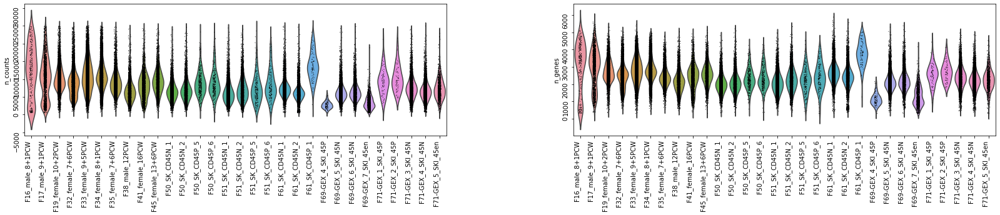

In [85]:
ss.lib.set_figsize((10,4))
sc.pl.violin(adFib1, keys=['n_counts', 'n_genes'], groupby='sample', rotation=90)

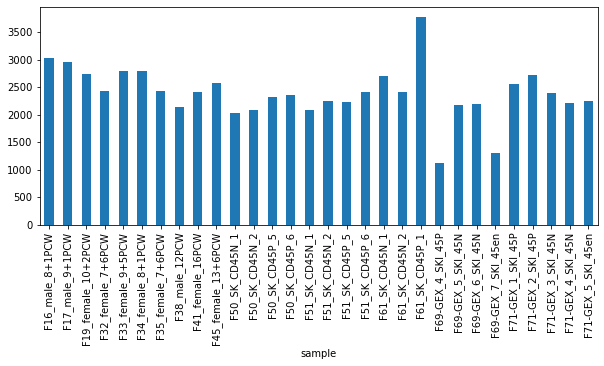

In [86]:
adFib1.obs.groupby('sample')['n_genes'].agg('mean').plot(kind='bar')

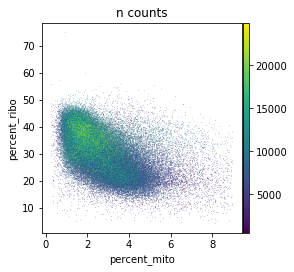

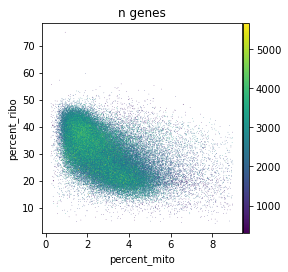

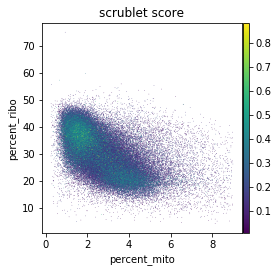

In [67]:
sc.pl.scatter(adFib1, x='percent_mito', y='percent_ribo', color='n_counts')
sc.pl.scatter(adFib1, x='percent_mito', y='percent_ribo', color='n_genes')
sc.pl.scatter(adFib1, x='percent_mito', y='percent_ribo', color='scrublet_score')

In [87]:
ss.lib.simple_default_pipeline(
    adFib1,
    filter_params=None,
    hvg_params={'flavor': 'seurat', 'by_batch': ['chemistry', 2]},
    scale_params={'max_value': 10},
    pca_params={'n_comps': 50, 'svd_solver': 'arpack', 'use_highly_variable': True},
    harmony_params=None,
    nb_params={'use_rep': 'X_pca', 'key_added': 'orig'},
    umap_params={'use_graph': 'neighbors_orig', 'key_added': 'orig'},
    leiden_params={'resolution': CLUSTER_RESOLUTIONS, 'use_graph': 'neighbors_orig', 'key_added': 'orig'},
    tsne_params=None, diffmap_params=None, fdg_params=None,
)

k_annot = (adFib1.obs['annot'] != 'nan').values
adFib1.obs['lr_annot'] = ss.lib.LR_annotate(
    adFib1, train_label=adFib1.obs['annot'].values, train_x=adFib1.obsm['X_pca'], subset=k_annot, use_rep='X_pca', return_label=True)
adFib1.obs['lr_annot'] = adFib1.obs['lr_annot'].astype('category')

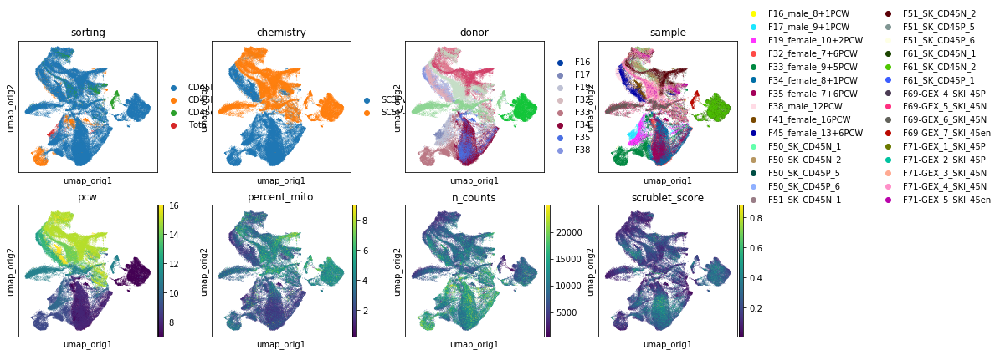

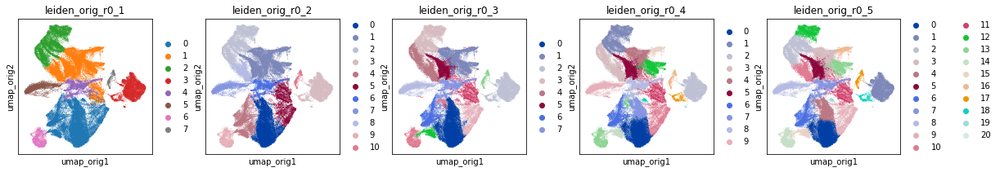

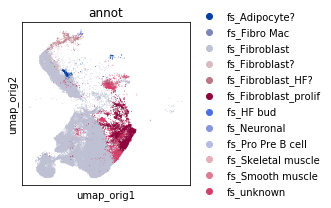

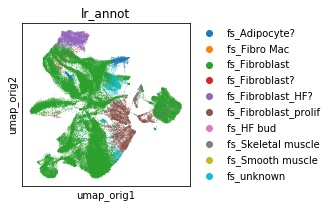

                      freq             p
leiden_orig_r0_3                        
0                 0.000724  7.500003e-01
1                 0.016535  3.195989e-05
2                 0.000398  7.500003e-01
3                 0.002213  7.500003e-01
4                 0.004975  4.494900e-01
5                 0.002167  7.500003e-01
6                 0.002264  7.500003e-01
7                 0.027607  1.648681e-13
8                 0.050155  0.000000e+00
9                 0.001735  7.500003e-01
10                0.016703  3.192321e-05
11                0.007423  1.555116e-01
12                0.000000  7.500003e-01
13                0.019504  7.055751e-07
14                0.000000  7.500003e-01
                     score         p
leiden_orig_r0_3                    
0                 0.231982  0.626252
1                 0.146391  0.928065
2                 0.224208  0.626252
3                 0.102847  0.928065
4                 0.173635  0.928065
5                 0.143942  0.928065
6      

In [89]:
adFib1.obs['doublet'] = adFib1.obs['bh_doublet_pval'] < 0.05
adFib1.obs['doublet'] = adFib1.obs['doublet'].astype('category')
ss.lib.set_figsize((3,3))
plot_scatter(
    adFib1, basis='umap_orig',
    color=['sorting', 'chemistry', 'donor', 'sample', 'pcw', 'percent_mito', 'n_counts', 'scrublet_score'])
plot_scatter(
    adFib1, basis='umap_orig', ncols=len(CLUSTER_RESOLUTIONS),
    color=[f'leiden_orig_r{str(res).replace(".", "_")}' for res in CLUSTER_RESOLUTIONS])
plot_scatter(
    adFib1[k_annot, :], basis='umap_orig',
    color='annot')
plot_scatter(
    adFib1, basis='umap_orig',
    color='lr_annot')

doublet_freq = adFib1.obs.groupby('leiden_orig_r0_3')['doublet'].agg(lambda x: sum(x)/len(x))
_, p = ss.lib.test_outlier(doublet_freq, upper_mad_only=False)
print(pd.DataFrame({'freq': doublet_freq, 'p': p}))

doublet_freq = adFib1.obs.groupby('leiden_orig_r0_3')['scrublet_score'].agg(lambda x: sum(x)/len(x))
_, p = ss.lib.test_outlier(doublet_freq, upper_mad_only=False)
print(pd.DataFrame({'score': doublet_freq, 'p': p}))

# Harmony

In [90]:
ss.lib.simple_default_pipeline(
    adFib1,
    filter_params=None, norm_params=None, hvg_params=None, scale_params=None, pca_params=None,
    harmony_params={'batch': 'sample', 'key_added': 'hm'},
    nb_params={'use_rep': 'X_pca_hm', 'key_added': 'hm'},
    umap_params={'use_graph': 'neighbors_hm', 'key_added': 'hm'},
    leiden_params={'resolution': CLUSTER_RESOLUTIONS, 'use_graph': 'neighbors_hm', 'key_added': 'hm'},
    tsne_params=None, diffmap_params=None, fdg_params=None,
)

AnnData object with n_obs × n_vars = 100841 × 26383 
    obs: 'bh_doublet_pval', 'cell_caller', 'cluster_scrublet_score', 'doublet_pval', 'mt_prop', 'n_counts', 'n_genes', 'sanger_id', 'scrublet_score', 'chemistry', 'donor', 'gender', 'pcw', 'sorting', 'sample', 'chemistry_sorting', 'annot', 'hierarchy1', 'percent_mito', 'percent_ribo', 'percent_hb', 'leiden_orig_r0_1', 'leiden_orig_r0_2', 'leiden_orig_r0_3', 'leiden_orig_r0_4', 'leiden_orig_r0_5', 'lr_annot', 'doublet', 'leiden_hm_r0_1', 'leiden_hm_r0_2', 'leiden_hm_r0_3', 'leiden_hm_r0_4', 'leiden_hm_r0_5'
    var: 'gene_ids', 'cc', 'mito', 'ribo', 'hb', 'n_cells', 'highly_variable'
    uns: 'pca', 'neighbors_orig', 'leiden', 'sorting_colors', 'chemistry_colors', 'donor_colors', 'sample_colors', 'leiden_orig_r0_1_colors', 'leiden_orig_r0_2_colors', 'leiden_orig_r0_3_colors', 'leiden_orig_r0_4_colors', 'leiden_orig_r0_5_colors', 'lr_annot_colors', 'neighbors_hm', 'neighbors'
    obsm: 'X_pca', 'X_umap_orig', 'X_pca_hm', 'X_umap_hm'
  

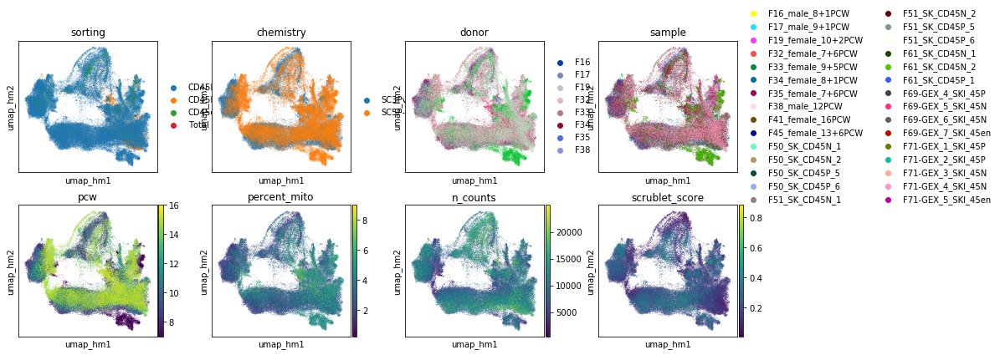

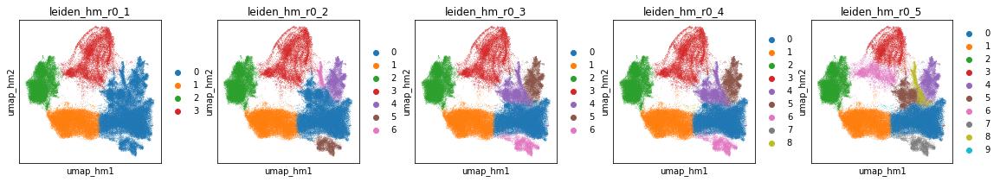

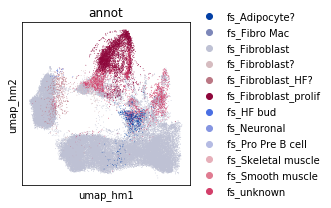

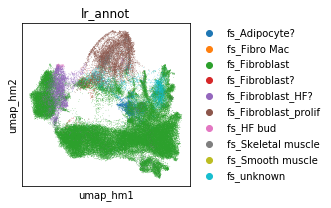

In [91]:
ss.lib.set_figsize((3,3))
plot_scatter(
    adFib1, basis='umap_hm',
    color=['sorting', 'chemistry', 'donor', 'sample', 'pcw', 'percent_mito', 'n_counts', 'scrublet_score'])
plot_scatter(
    adFib1, basis='umap_hm', ncols=len(CLUSTER_RESOLUTIONS),
    color=[f'leiden_hm_r{str(res).replace(".", "_")}' for res in CLUSTER_RESOLUTIONS])
plot_scatter(adFib1[k_annot, :], basis='umap_hm', color='annot')
plot_scatter(adFib1, basis='umap_hm', color='lr_annot')

# BBKNN

In [92]:
adFib1.uns['neighbors'] = adFib1.uns['neighbors_orig']
bbknn.bbknn(adFib1, batch_key='sample', metric='euclidean', neighbors_within_batch=2, trim=None, copy=False)
adFib1.uns['neighbors_bk'] = adFib1.uns['neighbors']
ss.lib.umap(adFib1, use_graph='neighbors_bk', key_added='bk')
ss.lib.leiden(adFib1, use_graph='neighbors_bk', key_added='bk', resolution=CLUSTER_RESOLUTIONS)

AnnData object with n_obs × n_vars = 100841 × 26383 
    obs: 'bh_doublet_pval', 'cell_caller', 'cluster_scrublet_score', 'doublet_pval', 'mt_prop', 'n_counts', 'n_genes', 'sanger_id', 'scrublet_score', 'chemistry', 'donor', 'gender', 'pcw', 'sorting', 'sample', 'chemistry_sorting', 'annot', 'hierarchy1', 'percent_mito', 'percent_ribo', 'percent_hb', 'leiden_orig_r0_1', 'leiden_orig_r0_2', 'leiden_orig_r0_3', 'leiden_orig_r0_4', 'leiden_orig_r0_5', 'lr_annot', 'doublet', 'leiden_hm_r0_1', 'leiden_hm_r0_2', 'leiden_hm_r0_3', 'leiden_hm_r0_4', 'leiden_hm_r0_5', 'leiden_bk_r0_1', 'leiden_bk_r0_2', 'leiden_bk_r0_3', 'leiden_bk_r0_4', 'leiden_bk_r0_5'
    var: 'gene_ids', 'cc', 'mito', 'ribo', 'hb', 'n_cells', 'highly_variable'
    uns: 'pca', 'neighbors_orig', 'leiden', 'sorting_colors', 'chemistry_colors', 'donor_colors', 'sample_colors', 'leiden_orig_r0_1_colors', 'leiden_orig_r0_2_colors', 'leiden_orig_r0_3_colors', 'leiden_orig_r0_4_colors', 'leiden_orig_r0_5_colors', 'lr_annot_colors'

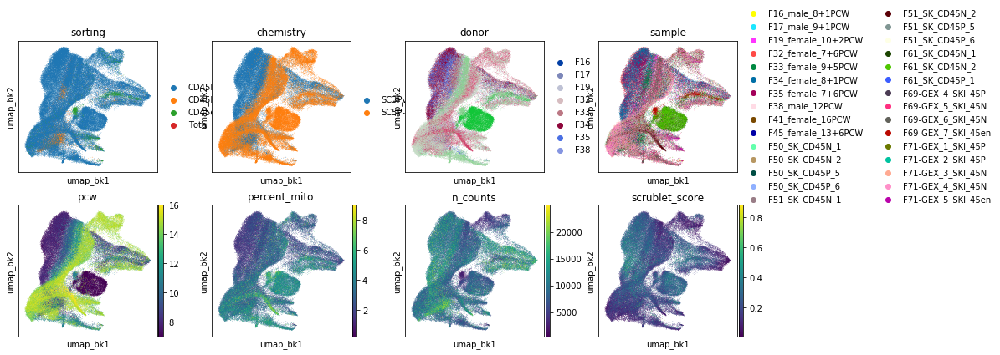

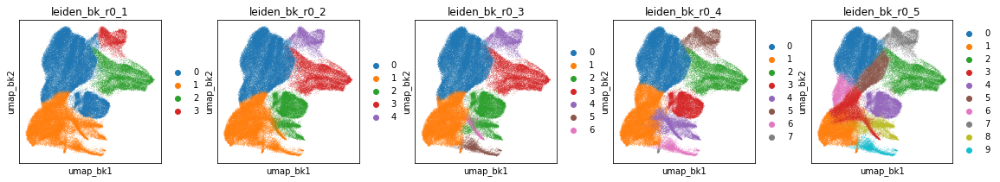

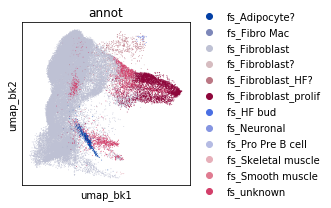

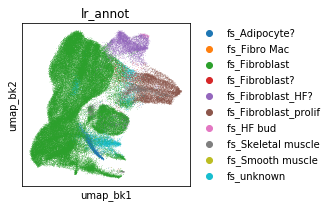

In [95]:
ss.lib.set_figsize((3,3))
plot_scatter(
    adFib1, basis='umap_bk',
    color=['sorting', 'chemistry', 'donor', 'sample', 'pcw', 'percent_mito', 'n_counts', 'scrublet_score'])
plot_scatter(
    adFib1, basis='umap_bk', ncols=len(CLUSTER_RESOLUTIONS),
    color=[f'leiden_bk_r{str(res).replace(".", "_")}' for res in CLUSTER_RESOLUTIONS])
plot_scatter(adFib1[k_annot, :], basis='umap_bk', color='annot')
plot_scatter(adFib1, basis='umap_bk', color='lr_annot')

In [104]:
adFib1.write('data/h5ad/fetal_skin_hierarch2_fibroblast_processed.h5ad', compression='lzf')

# 6.2. Without CC

In [16]:
import gc
gc.collect()

9953

In [18]:
adFib2 = adFib.copy()[:, ~adFib.var.cc.values]

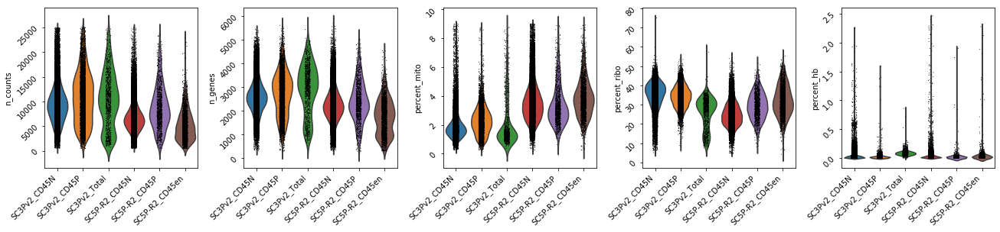

In [19]:
ss.lib.set_figsize((4,4))
ss.lib.plot_qc(adFib2, groupby='chemistry_sorting', groupby_only=True)

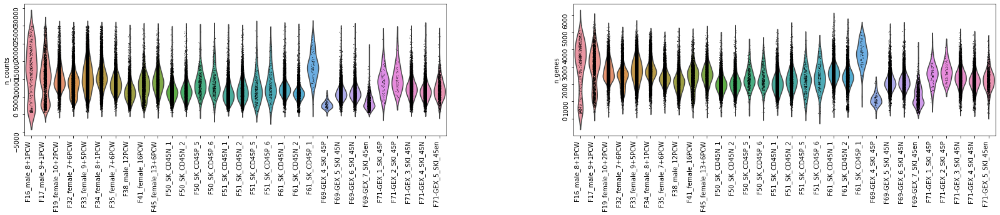

In [20]:
ss.lib.set_figsize((10,4))
sc.pl.violin(adFib2, keys=['n_counts', 'n_genes'], groupby='sample', rotation=90)

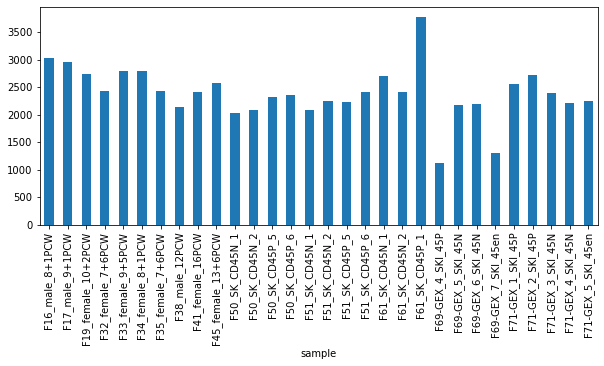

In [21]:
adFib2.obs.groupby('sample')['n_genes'].agg('mean').plot(kind='bar')

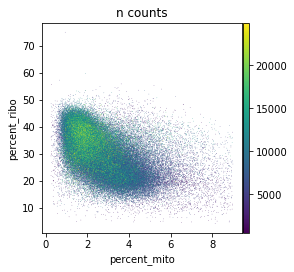

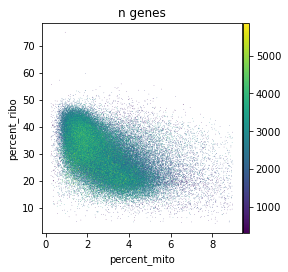

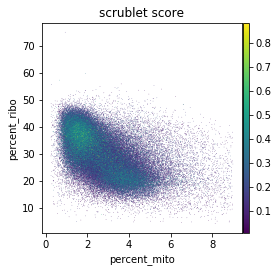

In [22]:
ss.lib.set_figsize((4,4))
sc.pl.scatter(adFib2, x='percent_mito', y='percent_ribo', color='n_counts')
sc.pl.scatter(adFib2, x='percent_mito', y='percent_ribo', color='n_genes')
sc.pl.scatter(adFib2, x='percent_mito', y='percent_ribo', color='scrublet_score')

In [ ]:
ss.lib.simple_default_pipeline(
    adFib2,
    filter_params=None,
    hvg_params={'flavor': 'seurat', 'by_batch': ['chemistry', 2]},
    scale_params={'max_value': 10},
    pca_params={'n_comps': 50, 'svd_solver': 'arpack', 'use_highly_variable': True},
    harmony_params=None,
    nb_params={'use_rep': 'X_pca', 'key_added': 'orig'},
    umap_params={'use_graph': 'neighbors_orig', 'key_added': 'orig'},
    leiden_params={'resolution': CLUSTER_RESOLUTIONS, 'use_graph': 'neighbors_orig', 'key_added': 'orig'},
    tsne_params=None, diffmap_params=None, fdg_params=None,
)

k_annot = (adFib2.obs['annot'] != 'nan').values
adFib2.obs['lr_annot'] = ss.lib.LR_annotate(
    adFib2, train_label=adFib2.obs['annot'].values, train_x=adFib2.obsm['X_pca'], subset=k_annot, use_rep='X_pca', return_label=True)
adFib2.obs['lr_annot'] = adFib2.obs['lr_annot'].astype('category')

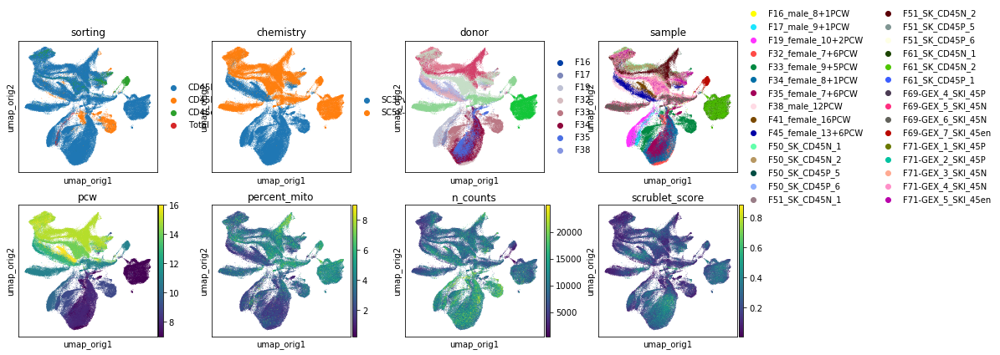

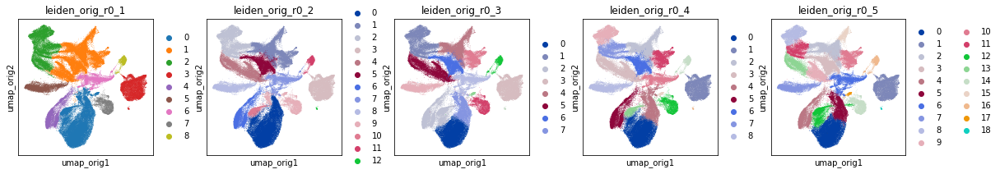

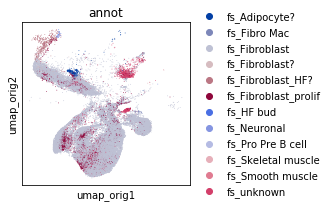

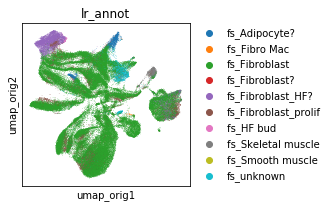

                      freq             p
leiden_orig_r0_3                        
0                 0.000176  7.584630e-01
1                 0.002305  7.584630e-01
2                 0.001263  7.584630e-01
3                 0.000399  7.584630e-01
4                 0.013071  2.932861e-01
5                 0.004593  7.584630e-01
6                 0.007543  7.584630e-01
7                 0.003784  7.584630e-01
8                 0.026743  2.696980e-03
9                 0.049744  4.062251e-11
10                0.014583  2.384548e-01
11                0.021418  2.549996e-02
12                0.004695  7.584630e-01
13                0.000000  7.584630e-01
14                0.000000  7.584630e-01
                     score         p
leiden_orig_r0_3                    
0                 0.231995  0.251922
1                 0.104124  0.958207
2                 0.179272  0.749187
3                 0.224414  0.251922
4                 0.136621  0.886902
5                 0.172990  0.749187
6      

In [25]:
adFib2.obs['doublet'] = adFib2.obs['bh_doublet_pval'] < 0.05
adFib2.obs['doublet'] = adFib2.obs['doublet'].astype('category')
ss.lib.set_figsize((3,3))
plot_scatter(
    adFib2, basis='umap_orig',
    color=['sorting', 'chemistry', 'donor', 'sample', 'pcw', 'percent_mito', 'n_counts', 'scrublet_score'])
plot_scatter(
    adFib2, basis='umap_orig', ncols=len(CLUSTER_RESOLUTIONS),
    color=[f'leiden_orig_r{str(res).replace(".", "_")}' for res in CLUSTER_RESOLUTIONS])
plot_scatter(
    adFib2[k_annot, :], basis='umap_orig',
    color='annot')
plot_scatter(
    adFib2, basis='umap_orig',
    color='lr_annot')

doublet_freq = adFib2.obs.groupby('leiden_orig_r0_3')['doublet'].agg(lambda x: sum(x)/len(x))
_, p = ss.lib.test_outlier(doublet_freq, upper_mad_only=False)
print(pd.DataFrame({'freq': doublet_freq, 'p': p}))

doublet_freq = adFib2.obs.groupby('leiden_orig_r0_3')['scrublet_score'].agg(lambda x: sum(x)/len(x))
_, p = ss.lib.test_outlier(doublet_freq, upper_mad_only=False)
print(pd.DataFrame({'score': doublet_freq, 'p': p}))

# Harmony

In [26]:
ss.lib.simple_default_pipeline(
    adFib2,
    filter_params=None, norm_params=None, hvg_params=None, scale_params=None, pca_params=None,
    harmony_params={'batch': 'sample', 'key_added': 'hm'},
    nb_params={'use_rep': 'X_pca_hm', 'key_added': 'hm'},
    umap_params={'use_graph': 'neighbors_hm', 'key_added': 'hm'},
    leiden_params={'resolution': CLUSTER_RESOLUTIONS, 'use_graph': 'neighbors_hm', 'key_added': 'hm'},
    tsne_params=None, diffmap_params=None, fdg_params=None,
)

AnnData object with n_obs × n_vars = 100841 × 25821 
    obs: 'bh_doublet_pval', 'cell_caller', 'cluster_scrublet_score', 'doublet_pval', 'mt_prop', 'n_counts', 'n_genes', 'sanger_id', 'scrublet_score', 'chemistry', 'donor', 'gender', 'pcw', 'sorting', 'sample', 'chemistry_sorting', 'annot', 'hierarchy1', 'percent_mito', 'percent_ribo', 'percent_hb', 'leiden_orig_r0_1', 'leiden_orig_r0_2', 'leiden_orig_r0_3', 'leiden_orig_r0_4', 'leiden_orig_r0_5', 'lr_annot', 'doublet', 'leiden_hm_r0_1', 'leiden_hm_r0_2', 'leiden_hm_r0_3', 'leiden_hm_r0_4', 'leiden_hm_r0_5'
    var: 'gene_ids', 'cc', 'mito', 'ribo', 'hb', 'n_cells', 'highly_variable'
    uns: 'pca', 'neighbors_orig', 'leiden', 'sorting_colors', 'chemistry_colors', 'donor_colors', 'sample_colors', 'leiden_orig_r0_1_colors', 'leiden_orig_r0_2_colors', 'leiden_orig_r0_3_colors', 'leiden_orig_r0_4_colors', 'leiden_orig_r0_5_colors', 'lr_annot_colors', 'neighbors_hm', 'neighbors'
    obsm: 'X_pca', 'X_umap_orig', 'X_pca_hm', 'X_umap_hm'
  

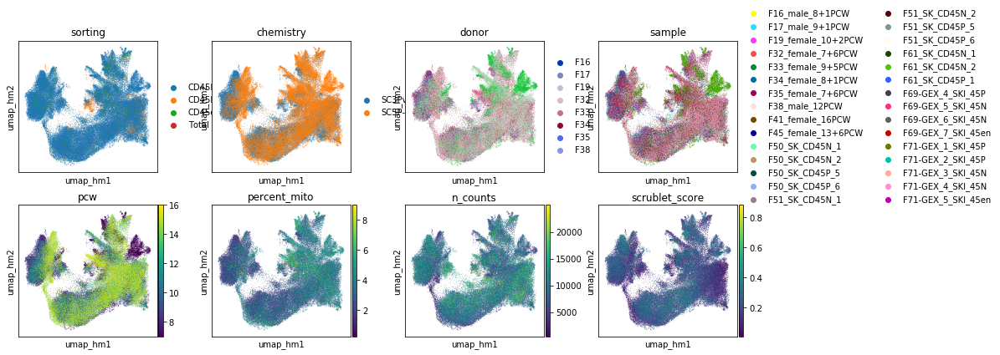

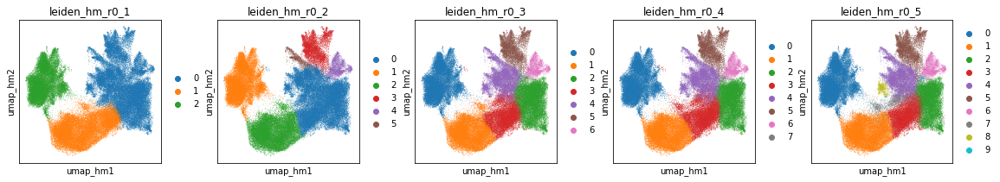

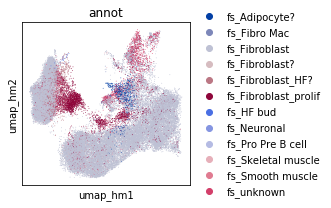

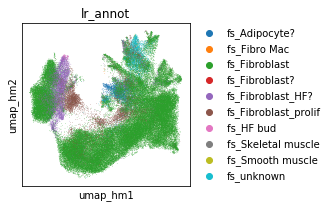

In [27]:
ss.lib.set_figsize((3,3))
plot_scatter(
    adFib2, basis='umap_hm',
    color=['sorting', 'chemistry', 'donor', 'sample', 'pcw', 'percent_mito', 'n_counts', 'scrublet_score'])
plot_scatter(
    adFib2, basis='umap_hm', ncols=len(CLUSTER_RESOLUTIONS),
    color=[f'leiden_hm_r{str(res).replace(".", "_")}' for res in CLUSTER_RESOLUTIONS])
plot_scatter(adFib2[k_annot, :], basis='umap_hm', color='annot')
plot_scatter(adFib2, basis='umap_hm', color='lr_annot')

# BBKNN

In [28]:
adFib2.uns['neighbors'] = adFib2.uns['neighbors_orig']
bbknn.bbknn(adFib2, batch_key='sample', metric='euclidean', neighbors_within_batch=2, trim=None, copy=False)
adFib2.uns['neighbors_bk'] = adFib2.uns['neighbors']
ss.lib.umap(adFib2, use_graph='neighbors_bk', key_added='bk')
ss.lib.leiden(adFib2, use_graph='neighbors_bk', key_added='bk', resolution=CLUSTER_RESOLUTIONS)

['leiden_bk_r0_1',
 'leiden_bk_r0_2',
 'leiden_bk_r0_3',
 'leiden_bk_r0_4',
 'leiden_bk_r0_5']

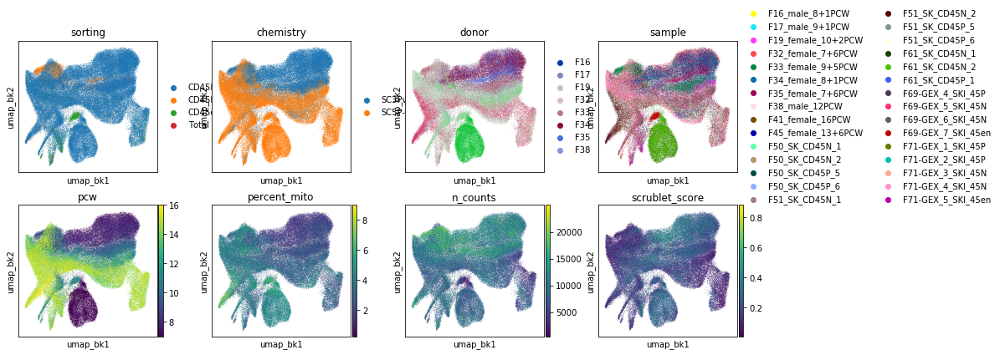

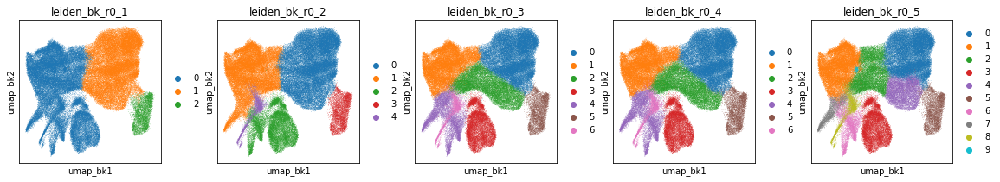

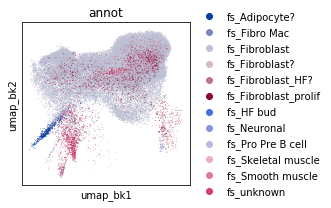

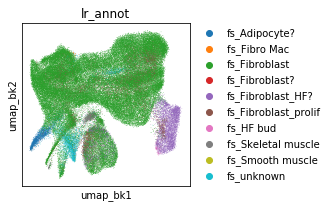

In [29]:
ss.lib.set_figsize((3,3))
plot_scatter(
    adFib2, basis='umap_bk',
    color=['sorting', 'chemistry', 'donor', 'sample', 'pcw', 'percent_mito', 'n_counts', 'scrublet_score'])
plot_scatter(
    adFib2, basis='umap_bk', ncols=len(CLUSTER_RESOLUTIONS),
    color=[f'leiden_bk_r{str(res).replace(".", "_")}' for res in CLUSTER_RESOLUTIONS])
plot_scatter(adFib2[k_annot, :], basis='umap_bk', color='annot')
plot_scatter(adFib2, basis='umap_bk', color='lr_annot')